<h1 align="center"><font color='White'>Renewal Probability Predictor</font></h1>

## Introduction

Renewal after a free trial period is a critical aspect for Lumin. In this project, our primary objective is to develop a predictive model aimed at estimating the likelihood of customers renewing their subscriptions following a free trial. Analysis on key factors that impact customer retention is also included

### Data Sources
* OMS Data
* Amplitude Pageviews
* Ampltidue Survey Responses

### Data Notes
* Lumin Free Trial Orders Jan 2023 - Sep 2023

### Key Steps Involved

1. **Data Exploration :** We will dive into exploring the dataset, and understanding the distribution and importance of different features 

2. **Data Preprocessing:** We will preprocess the data to make the data suitable for modeling. Preprocessing steps will involve encoding categorical variables, and potentially feature transformations to prepare the data for predictive modeling.

3. **Model Development:** We will construct a model capable of estimating customer renewal probabilities leveraging machine learning algorithms, 

4. **Model Evaluation:** We will assess the performance of our predictive model using appropriate evaluation metrics.

5. **Next Steps:** We will discuss the action items based off of the analysis and the model.

## Import Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import ast
import matplotlib.cm as cm
from matplotlib.gridspec import GridSpec
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [2]:
df_raw=pd.read_csv(r'Churn Prediction Data with cancelled date.csv',parse_dates=['CREATED_AT','FIRST_ACCOUT_VISIT','LAST_ACCOUT_VISIT','FIRST_SUBSCRIPTION_VISIT','LAST_SUBSCRIPTION_VISIT','DELIVERED_AT'])

In [3]:
df_raw['FULFILLMENT_REGION']=np.where(df_raw['COUNTRY_CODE'].isin(['ES','DE','FR']),df_raw['COUNTRY_CODE'],df_raw['FULFILLMENT_REGION'])

In [4]:
## Difine Functions to plot charts
def plot_bar_chart(df,column,subplot):
    group_df=df.groupby([column,'RENEWED'])['RENEWAL_REVENUE'].count().reset_index()
    totals=group_df.groupby(column).transform(sum)['RENEWAL_REVENUE'].rename('ORDERS')
    combined=pd.concat([group_df,totals],axis=1)
    combined['RATIO']=(combined.iloc[:,-2]/combined.iloc[:,-1])*100
    df_pivot=pd.pivot(data=combined,index=column,columns=['RENEWED'],values=['RATIO','ORDERS']).reset_index()
    df_pivot=df_pivot.iloc[:,:3]
    df_pivot.columns=[column,0,1]
    df_pivot=df_pivot.reindex(columns=[column,1,0])
    ax=df_pivot.plot(kind='bar',x=column,stacked=True,ax=subplot)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

def combo_charts_by_variable(df,column):
    by_region=pd.pivot_table(data=df,index=column,columns='RENEWED',values='CREATED_AT',aggfunc='count')
    by_region['Renew Rate']=by_region['Renewed']/by_region.sum(axis=1)
    display(by_region)
    ax=sns.countplot(data=df,x=column,palette=['orange'],order=by_region.index)
    ax1=ax.twinx()
    ax1.plot(by_region.index,by_region['Renew Rate']*100)
    ax1.set_ylabel('Renewed Rate')
    ax1.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set_title(f'Orders/Renew Rate by {column}')
    ax.tick_params(labelrotation=90)
    plt.show()

def inspect_column(df,col,rows,columns,figsize):
    fig, ax = plt.subplots(nrows=rows, ncols=columns, facecolor=(1, 1, 1),figsize=figsize, sharey='row')
    for i,variable in enumerate(np.sort(df[col].unique())):
        ax[0,i].pie(x=df[df[col]==variable].groupby('RENEWED').count()['RENEWAL_REVENUE'].values[::-1],labels=df[df[col]==variable].groupby('RENEWED').count()['RENEWAL_REVENUE'].index[::-1],autopct='%1.1f%%')
        ax[0,i].set_title(f'{col}: {variable} Order Distribution')
        sns.countplot(data=df[df[col]==variable],x='RENEWED',ax=ax[1,i],order=['Renewed','Churned'])
        ax[1,i].set_title(f'{col}: {variable} Orders')
        for index, value in enumerate(df[df[col]==variable].groupby('RENEWED').count()['RENEWAL_REVENUE'][::-1]):
            ax[1,i].text(index, value + 1, f'{value:,}', ha='center', va='bottom')
        fig.tight_layout()
    plt.show()
def inspect_column_matrix(df,col1,col2,rows,columns,figsize):
    fig, ax = plt.subplots(nrows=rows, ncols=columns, facecolor=(1, 1, 1),figsize=figsize, sharey='row', gridspec_kw={'height_ratios': [1,1.5]*int(rows*0.5)})
    for j,var1 in enumerate(np.sort(df[col1].unique())):
        for i,var2 in enumerate(np.sort(df[col2].unique())):
            ax[2*j,i].pie(x=df[(df[col1]==var1)&(df[col2]==var2)].groupby('RENEWED').count()['RENEWAL_REVENUE'].values[::-1],labels=df[(df[col1]==var1)&(df[col2]==var2)].groupby('RENEWED').count()['RENEWAL_REVENUE'].index[::-1],autopct='%1.1f%%',normalize=True)
            ax[2*j,i].set_title(f'{var1}/{var2} Order Distribution')
            sns.countplot(data=df[(df[col1]==var1)&(df[col2]==var2)],x='RENEWED',ax=ax[2*j+1,i],order=['Renewed','Churned'])
            ax[2*j+1,i].set_title(f'{var1}/{var2} Orders')
            for index, value in enumerate(df[(df[col1]==var1)&(df[col2]==var2)].groupby('RENEWED').count()['RENEWAL_REVENUE'][::-1]):
                ax[2*j+1,i].text(index, value + 1, f'{value:,}', ha='center', va='bottom')
    plt.subplots_adjust(hspace=(0.3))
    fig.tight_layout()
    plt.show()

## Exploratory Data Analysis

In [5]:
df=df_raw.copy()

In [6]:
df.head()

,CREATED_AT,RENEWAL_REVENUE,FULFILLMENT_REGION,COUNTRY_CODE,RECENT_CHANNEL,COMPLETE_HDYHAU,HAS_POSTPURCHASE_SURVEY,ORDER_UPSELL,DMA,SHIPPING_METHOD,FINISHED_FT_QUIZ,WHO_ARE_YOU_BUYING_FOR_TODAY,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,GENDER,HOW_OLD_ARE_YOU,WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN,WHAT_IS_YOUR_SKIN_TYPE,HOW_SENSITIVE_IS_YOUR_SKIN,WHAT_IS_YOUR_TOP_SKINCARE_CONCERN,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE,HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW,WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT,WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW,WHICH_PRODUCTS_DO_YOU_USE_NOW,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU,CANCELLED_IN_1_DAY,CANCELLED_IN_7_DAY,CANCELLED_IN_14_DAYS,ORDER_TO_DELIVER,DELIVERED_AT,VISITED_HOW_TO,VISITED_ACCOUNT_CREATION,FIRST_ACCOUT_VISIT,LAST_ACCOUT_VISIT,FIRST_SUBSCRIPTION_VISIT,LAST_SUBSCRIPTION_VISIT,RENEWED
0,2023-06-27 21:44:14.869000+00:00,78.34,GB,GB,Facebook,False,False,False,NaN,standard,True,Myself,10_20,Male,25-34,I Wash My Face With Water Or Body Soap,Dry,Not_Sure,Overall Skin Health,"[\n ""Sun Damage"",\n ""Dry Skin"",\n ""Overall Skin Health""\n]",Somewhat Important,Not_Sure,Other,"[\n ""I Dont Use Any Products""\n]","[\n ""Still Figuring It Out""\n]",0,0,1,8,2023-07-05 10:59:00+00:00,0,0,NaT,NaT,NaT,NaT,Churned
1,2023-06-28 20:26:50.389000+00:00,72.68,US,US,Facebook,False,False,False,"Miami-Ft. Lauderdale, FL",express,True,Myself,20_30,Male,13-24,I Wash My Face With Water Or Body Soap,Combination,Very Sensitive,Overall Skin Health,"[\n ""Dark Circles"",\n ""Sun Damage"",\n ""Acne Scars"",\n ""Oily Skin"",\n ""Wrinkles"",\n ""Overall Skin Health""\n]",Very Important,In A Few Days,Nivea,"[\n ""I Dont Use Any Products""\n]","[\n ""No""\n]",0,0,0,7,2023-07-05 14:00:00+00:00,0,0,NaT,NaT,NaT,NaT,Renewed
2,2023-05-30 13:08:40.647000+00:00,72.68,US,US,Google,False,False,False,"Chicago, IL",standard,True,Myself,30_40,Male,35-45,I Have A Consistent Routine With Multiple Products,Combination,Not_Sure,Overall Skin Health,"[\n ""Sun Damage"",\n ""Uneven Tone"",\n ""Dark Circles"",\n ""Oily Skin"",\n ""Overall Skin Health""\n]",Very Important,Right Away,Neutrogena,"[\n ""Moisturizer"",\n ""Cleanser""\n]","[\n ""Still Figuring It Out""\n]",0,0,0,4,2023-06-03 17:28:00+00:00,0,0,NaT,NaT,NaT,NaT,Churned
3,2023-02-11 17:06:56.702000+00:00,63.68,GB,GB,Affiliate,False,False,False,NaN,standard,True,Myself,Not_Sure,Other,46-55,I Dont Have One,Combination,Somewhat Sensitive,Not_Sure,"[\n ""Not_Sure""\n]",Important,In A Few Days,Still Figuring It Out,"[\n ""I Dont Use Any Products""\n]","[\n ""Still Figuring It Out""\n]",0,0,1,10,2023-02-21 11:02:22+00:00,5,0,NaT,NaT,NaT,NaT,Churned
4,2023-02-12 01:54:46.975000+00:00,58.80,CA,CA,Facebook,True,False,False,NaN,standard,True,Myself,Not_Sure,Male,25-34,I Have A Consistent Routine With Multiple Products,Dry,Very Sensitive,Overall Skin Health,"[\n ""Dry Skin"",\n ""Overall Skin Health""\n]",Very Important,In A Few Days,Other,"[\n ""Moisturizer"",\n ""Cleanser""\n]","[\n ""Yes"",\n ""Yes Definitely""\n]",0,0,0,14,2023-03-01 20:50:00+00:00,0,0,NaT,NaT,NaT,NaT,Churned


#### Features
We analyzed 37 different variables and landed on the following ones as most important features for predicting renewal
* Expected Renewal Revenue
* Region (US, CA, MX, GB, AU, ES, FR, DE, ROW)
* Recent Channel
* Completed HDYHAU
* Had Postpurchase Survey
* Had Order Upsell
* Shipping Method
* Quiz Responses

#### Data Overview

There are 128,064 free trail orders in the datasets 


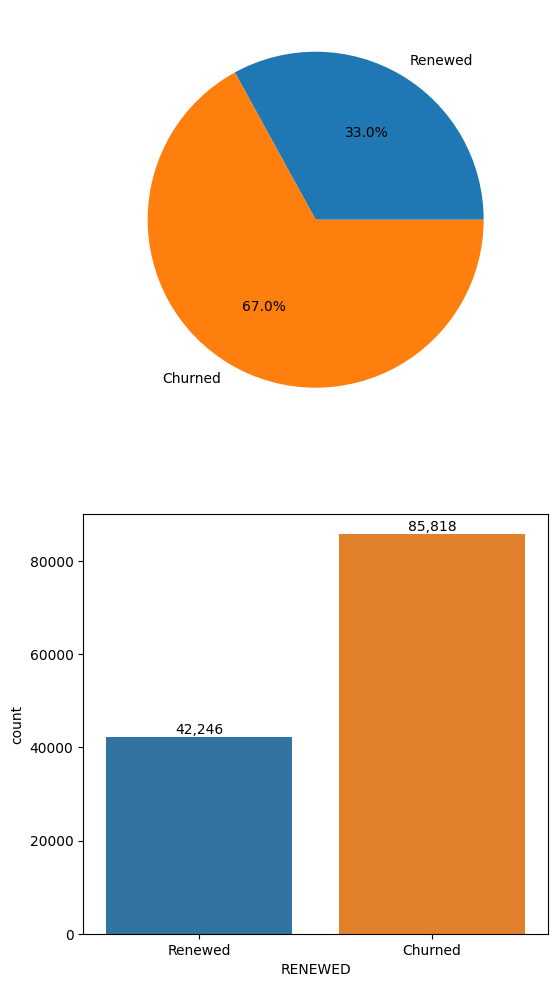

In [100]:
print(f'There are {len(df):,} free trail orders in the datasets ')
fig, ax = plt.subplots(nrows=2, ncols=1, facecolor=(1, 1, 1),figsize=(6, 12))
ax[0].pie(x=df.groupby('RENEWED').count()['RENEWAL_REVENUE'].values[::-1],labels=df.groupby('RENEWED').count()['RENEWAL_REVENUE'].index[::-1],autopct='%1.1f%%')
sns.countplot(data=df,x='RENEWED',ax=ax[1],order=['Renewed','Churned'])
for index, value in enumerate(df.groupby('RENEWED').count()['RENEWAL_REVENUE'][::-1]):
    ax[1].text(index, value + 1, f'{value:,}', ha='center', va='bottom')
plt.show()

#### Region Distribution

##### Findings:
* **US** is the biggest market and has the highest renewal rate
* **GB** is the second largest market, but its renewal rate is low
* **CA**, **AU** have similar renewal rate
* All **EU** countries including **GB** and **MX** have similiar renewal rate


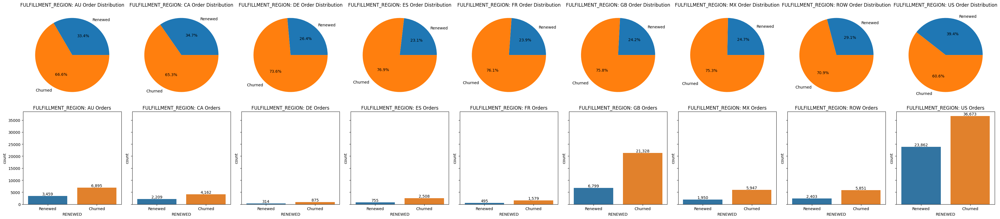

In [104]:
inspect_column(df,'FULFILLMENT_REGION',2,9,(36, 8))

### Marketing Channel Distribution

##### Findings:
* **Facebook** is the biggest channel with decent renewal rate
* **Affliate** has the lowest renewal rate
* **TikTok**, **No-paid social** and **Snapchat** have lower volume

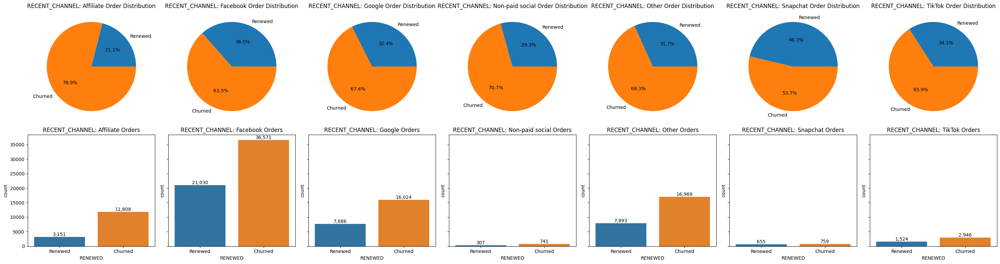

In [105]:
inspect_column(df,'RECENT_CHANNEL',2,7,(30, 8))

### Distribution by Channel & Region

##### Findings:
* **Affiliate** has the lower renewal rate across all regions
* **US Affiliate** retention rate is extremely low given other channels' retention rate is higher than other regions
* **Google** and **Facebook** have similar renewal rate across all regions

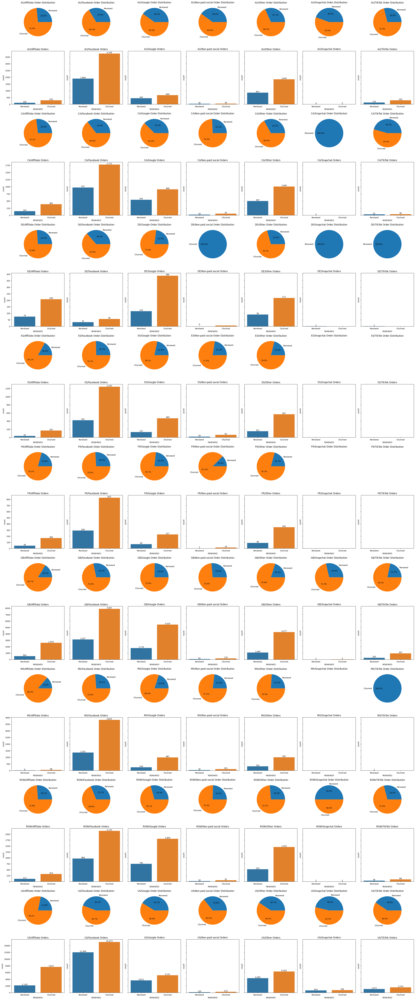

In [106]:
inspect_column_matrix(df,'FULFILLMENT_REGION','RECENT_CHANNEL',18,7,(30,72))

### Distribution by Users Finishing FT Quiz 

##### Findings:
* Users who had FT quiz are 10% more likely to renew

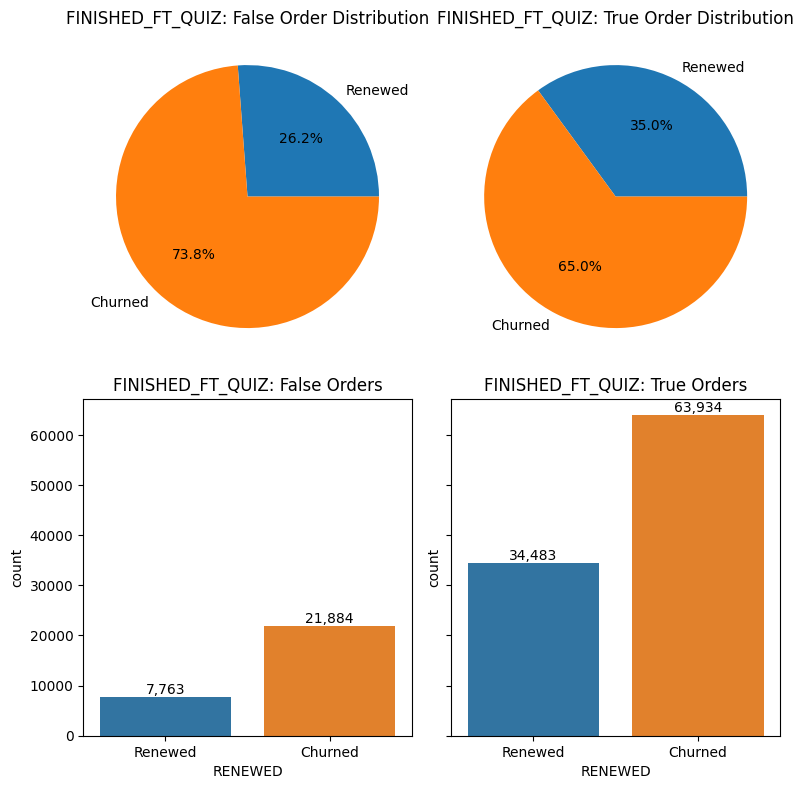

In [110]:
inspect_column(df,'FINISHED_FT_QUIZ',2,2,(8, 8))

### Distribution by Users Finishing FT Quiz by Region

##### Findings:
* For all regions, users who completed quiz are more likely to renew
* US users who had quiz are more likely to renew than other regions
    * why US renewed rate has such big difference?
        * Affliate has low quiz completion rate
        * US has the most affiliate users over other region

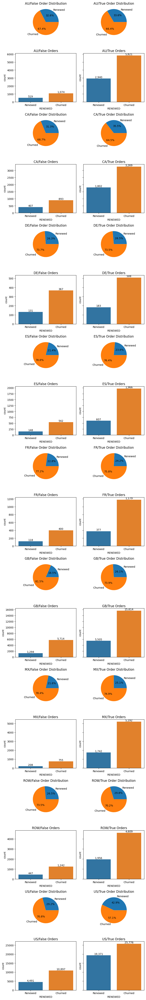

In [121]:
inspect_column_matrix(df,'FULFILLMENT_REGION','FINISHED_FT_QUIZ',18,2,(8,54))

In [13]:
us_quiz=df[(df.FINISHED_FT_QUIZ==True)&(df.FULFILLMENT_REGION=='US')]
us_no_quiz=df[(df.FINISHED_FT_QUIZ==False)&(df.FULFILLMENT_REGION=='US')]
channels=us_quiz.groupby('RECENT_CHANNEL').count()['CREATED_AT'].index
quiz_group=us_quiz.groupby('RECENT_CHANNEL').count()['CREATED_AT'].values
no_quiz_group=us_no_quiz.groupby('RECENT_CHANNEL').count()['CREATED_AT'].values
df_quiz=pd.DataFrame({'CHANNEL':channels,'COMPLETE_QUIZ':quiz_group,'NO_QUIZ':no_quiz_group})
df_quiz['COMPLETION_RATE']=df_quiz['COMPLETE_QUIZ']/df_quiz.sum(axis=1,numeric_only=True)
df_quiz['COMPLETION_RATE']=df_quiz['COMPLETION_RATE'].apply(lambda x:f'{x:.2%}')
df_quiz

,CHANNEL,COMPLETE_QUIZ,NO_QUIZ,COMPLETION_RATE
0,Affiliate,1734,8031,17.76%
1,Facebook,25259,1804,93.33%
2,Google,7541,1224,86.04%
3,Non-paid social,338,24,93.37%
4,Other,6536,4015,61.95%
5,Snapchat,1292,96,93.08%
6,TikTok,2447,194,92.65%


### Quiz Question Analysis

#### Which quiz questions are more corraleted to renewal?

In [14]:
quiz_cols=[ 'WHO_ARE_YOU_BUYING_FOR_TODAY',
       'HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS',
       'GENDER', 'HOW_OLD_ARE_YOU',
       'WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN',
       'WHAT_IS_YOUR_SKIN_TYPE', 'HOW_SENSITIVE_IS_YOUR_SKIN',
       'WHAT_IS_YOUR_TOP_SKINCARE_CONCERN',
       'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE',
       'HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW',
       'WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT',
       'WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW',
       'WHICH_PRODUCTS_DO_YOU_USE_NOW',
       'DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']

X=df[df['FINISHED_FT_QUIZ']==True][quiz_cols]
y=df[df['FINISHED_FT_QUIZ']==True]['RENEWED']

In [15]:
from sklearn.preprocessing import MultiLabelBinarizer
def string_tolist(x):
    return [word.strip() for word in x.strip('[]').replace('"', '').replace('\n','').split(',')]

def binarizer(df,column):
    df[column]=df[column].apply(string_tolist)
    mlb = MultiLabelBinarizer()
    encoded_column=mlb.fit_transform(df[column])
    encoded_df=pd.DataFrame(encoded_column,columns=[column+' '+ issue for issue in mlb.classes_])
    df=pd.concat([df.reset_index(drop=True),encoded_df],axis=1)
    df.drop(columns=[column],axis=1,inplace=True)
    return df

In [16]:
X=binarizer(X,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
X=binarizer(X,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
X=binarizer(X,'DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU')

In [17]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
for column in X.select_dtypes(include='object').columns:
    le = LabelEncoder()
    X[column] = le.fit_transform(X[column])
chi2_result=chi2(X,y)

##### Findings:
* **Ages** and **Willingness to Pay** are the two most important factor impacting retention
* **Skin Concerns** surprisingly don't affect renewal rate much

In [18]:
response_importance=pd.DataFrame({'Questions':X.columns,
 'Chi2 Score':chi2_result[0].round(2),
 'P value':chi2_result[1].round(3)})
response_importance.sort_values('Chi2 Score',ascending=False)

,Questions,Chi2 Score,P value
3,HOW_OLD_ARE_YOU,870.80,0.000
1,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,397.90,0.000
28,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes,376.02,0.000
26,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU No,130.86,0.000
30,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes Mostly,121.84,0.000
24,WHICH_PRODUCTS_DO_YOU_USE_NOW Moisturizer,83.20,0.000
23,WHICH_PRODUCTS_DO_YOU_USE_NOW I Dont Use Any Products,60.12,0.000
5,WHAT_IS_YOUR_SKIN_TYPE,46.10,0.000
20,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE Wrinkles,46.01,0.000
9,WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT,44.00,0.000


#### Do users from different channels care about different questions?

##### Findings:
* **Age** and **Willingness to Pay** are the two most impactful questions across all channels

In [19]:
channel_top3_questions={}
for channel in df.RECENT_CHANNEL.unique():
    X=df[(df['FINISHED_FT_QUIZ']==True)&(df['RECENT_CHANNEL']==channel)][quiz_cols]
    y=df[(df['FINISHED_FT_QUIZ']==True)&(df['RECENT_CHANNEL']==channel)]['RENEWED']
    X=binarizer(X,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
    X=binarizer(X,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
    X=binarizer(X,'DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU')
    for column in X.select_dtypes(include='object').columns:
        le = LabelEncoder()
        X[column] = le.fit_transform(X[column])
    chi2_result=chi2(X,y)
    indexed_list=list(enumerate(chi2_result[0]))
    sorted_list = sorted(indexed_list, key=lambda x: x[1], reverse=True)
    top3_index = [index for index, value in sorted_list[:3]]
    channel_top3_questions[channel]=list(X.columns[top3_index])
pd.DataFrame({'CHANNEL':channel_top3_questions.keys(),
 'No.1 QUESTION':[value[0] for value in channel_top3_questions.values()],
 'No.2 QUESTION':[value[1] for value in channel_top3_questions.values()],
 'No.3 QUESTION':[value[2] for value in channel_top3_questions.values()]})
    

,CHANNEL,No.1 QUESTION,No.2 QUESTION,No.3 QUESTION
0,Facebook,HOW_OLD_ARE_YOU,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS
1,Google,HOW_OLD_ARE_YOU,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes
2,Affiliate,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes,HOW_OLD_ARE_YOU,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE Overall Skin Health
3,Other,HOW_OLD_ARE_YOU,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes
4,TikTok,HOW_OLD_ARE_YOU,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes
5,Snapchat,WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE Not_Sure,WHICH_PRODUCTS_DO_YOU_USE_NOW Other
6,Non-paid social,HOW_OLD_ARE_YOU,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE Not_Sure,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU Yes Mostly


#### How does **Age** impact renewal?

##### Findings:
* Older users are more likely to renew
* Younger users are less likely to renew
* Other users have an average renewal rate

RENEWED,Churned,Renewed,Renew Rate
HOW_OLD_ARE_YOU,,,
13-24,23329,10121,0.302571
25-34,26378,13890,0.344939
35-45,11303,7696,0.405074
46-55,2324,2177,0.483670
56,600,599,0.499583


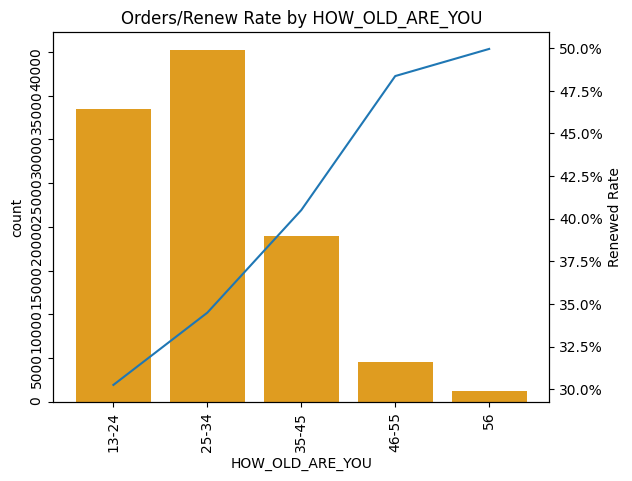

In [20]:
combo_charts_by_variable(df[df['FINISHED_FT_QUIZ']==True],'HOW_OLD_ARE_YOU')

#### Age Distribution by Channel

#### Findings:
* Higher age shows higher renewal rate across channel
* **Affiliate** has low renewal rate even for older users
* **Tiktok** has the most yonger users 
* **Snapchat** (small volume) have the largest proportion of older users

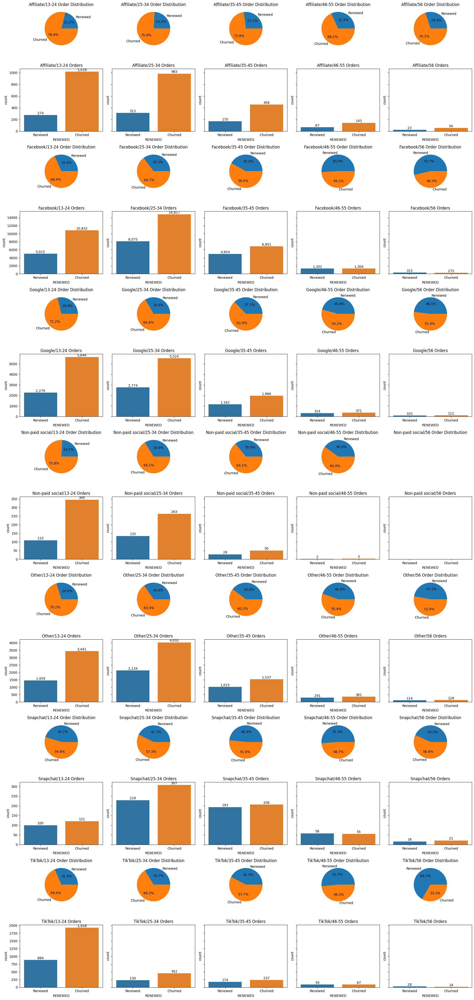

In [122]:
inspect_column_matrix(df[df.FINISHED_FT_QUIZ==True],'RECENT_CHANNEL','HOW_OLD_ARE_YOU',14,5,(20,42))

#### Age Distribution by Region

#### Findings:
* **US** has the highest relative proportion of older users
* **EU** countries have the lowest relative proportion of older users

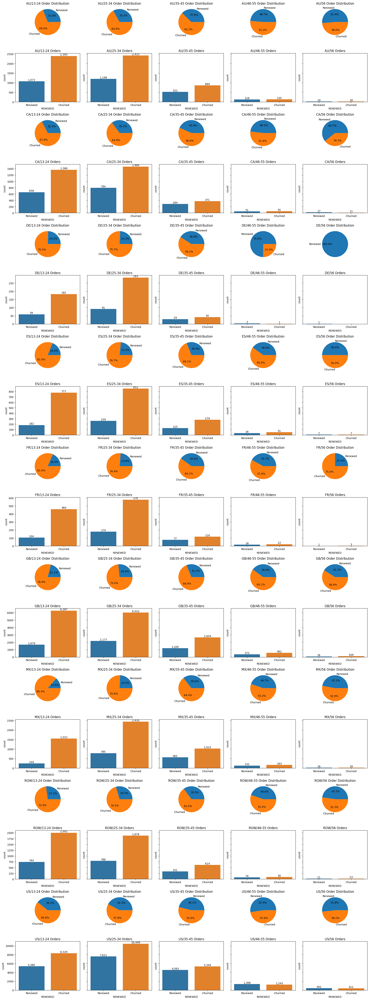

In [123]:
inspect_column_matrix(df[df.FINISHED_FT_QUIZ==True],'FULFILLMENT_REGION','HOW_OLD_ARE_YOU',18,5,(20,54))

#### How does **Willingness to Pay** impact renewal?

RENEWED,Churned,Renewed,Renew Rate
HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,,,
10_20,19581,8323,0.298273
20_30,14612,8152,0.358109
30_40,7253,4684,0.392393
More_Than_50,5874,3540,0.376036
Not_Sure,16614,9784,0.370634


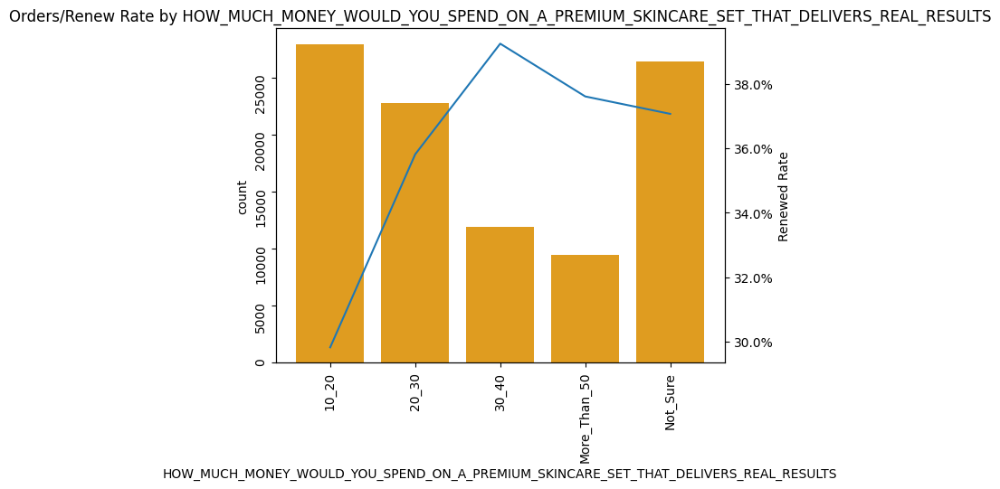

In [23]:
combo_charts_by_variable(df[df['FINISHED_FT_QUIZ']==True],'HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS')

#### Willingness to Pay Distribution by Channel

#### Findings:
* Users with 10_20 budget are most unlikely to renew across all the channels
* Users who are not sure about their budget have similar distribution to users with 20_30 budget
* Users with 30+ have a high budget and more likely to renew

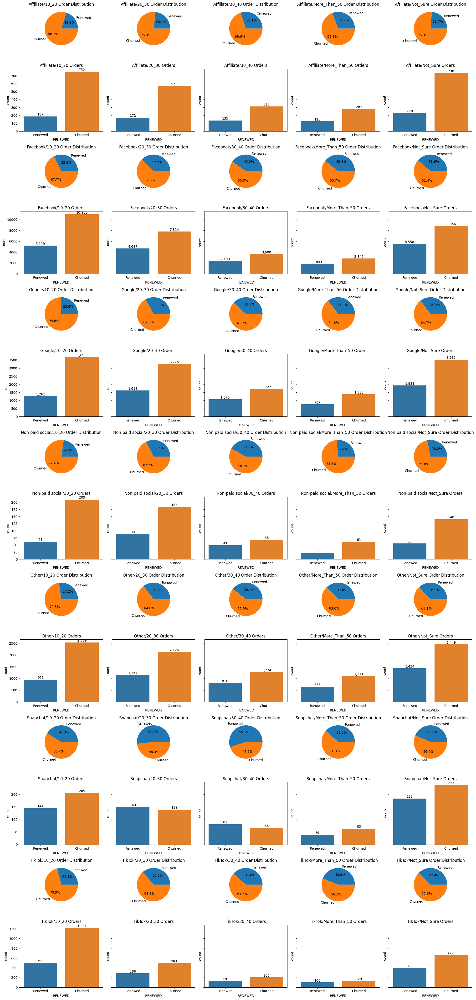

In [124]:
inspect_column_matrix(df[df.FINISHED_FT_QUIZ==True],'RECENT_CHANNEL','HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS',14,5,(20,42))

#### Willingness to Pay Distribution by Region

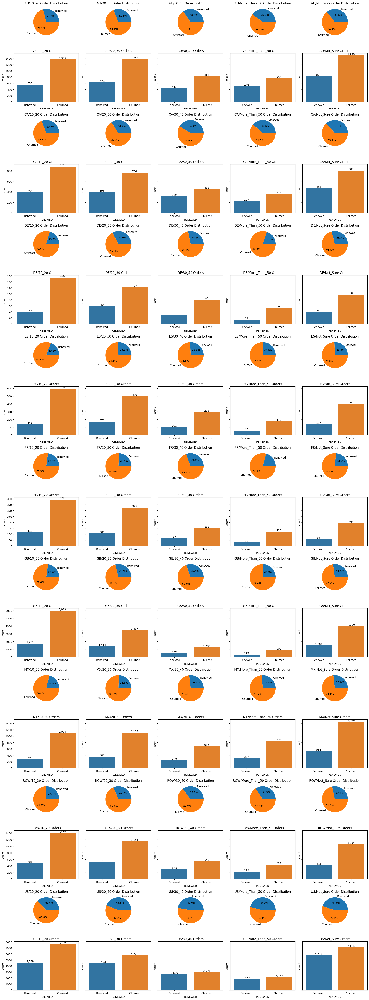

In [125]:
inspect_column_matrix(df[df.FINISHED_FT_QUIZ==True],'FULFILLMENT_REGION','HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS',18,5,(20,54))

#### Willingness to Pay vs. Age

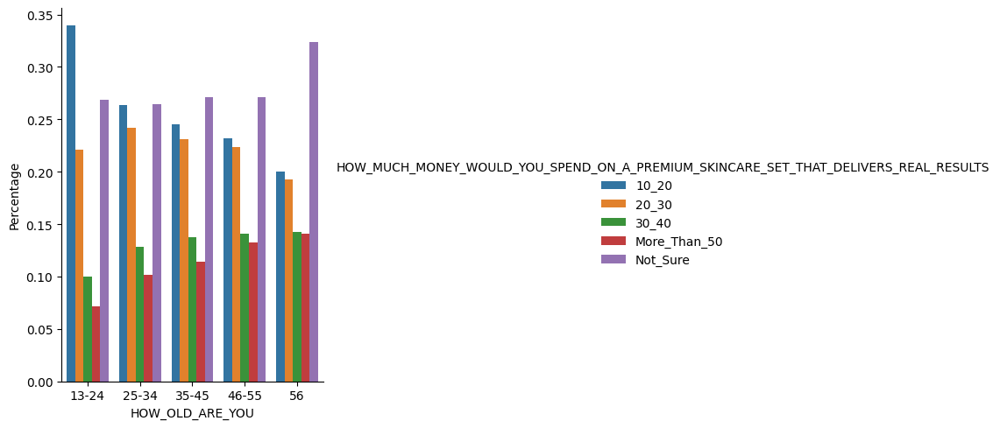

In [26]:
by_willingness_age=df[(df.FINISHED_FT_QUIZ==True)].groupby(['HOW_OLD_ARE_YOU','HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']).count()[['CREATED_AT']]
by_willingness_age_total=by_willingness_age.groupby(['HOW_OLD_ARE_YOU']).transform('sum').rename(columns={'CREATED_AT':'totals'})
by_willingness_age['totals']=by_willingness_age_total['totals']
by_willingness_age['Percentage']=by_willingness_age['CREATED_AT']/by_willingness_age['totals']
by_willingness_age=by_willingness_age.reset_index()
sns.catplot(data=by_willingness_age,x='HOW_OLD_ARE_YOU',hue='HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS',y='Percentage',kind='bar')
plt.show()

### Distribution by Users Having Order Upsell

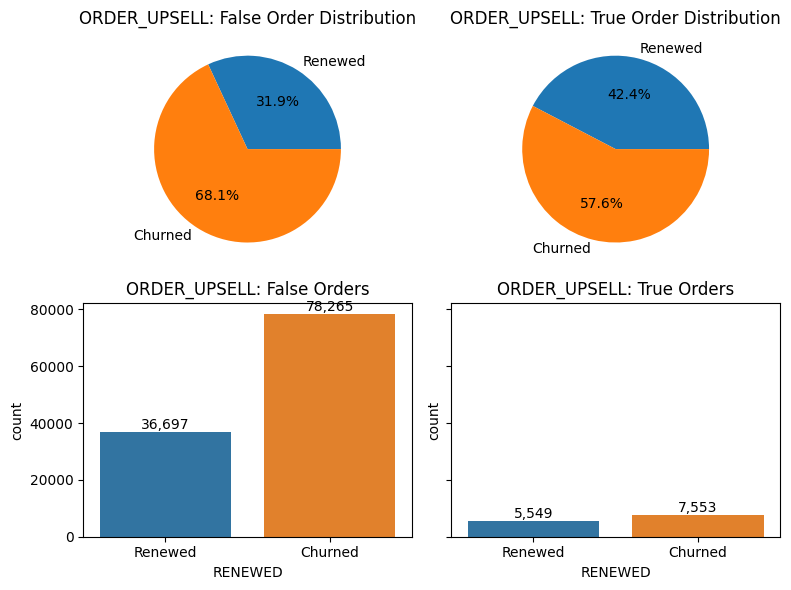

In [126]:
inspect_column(df,'ORDER_UPSELL',2,2,(8, 6))

#### Findings:
* Users having order upsell are more likely to renew than users who don't
* **Snapchat** users are more likely to have upsells
* **Affiliate** users are least likely to have upsells

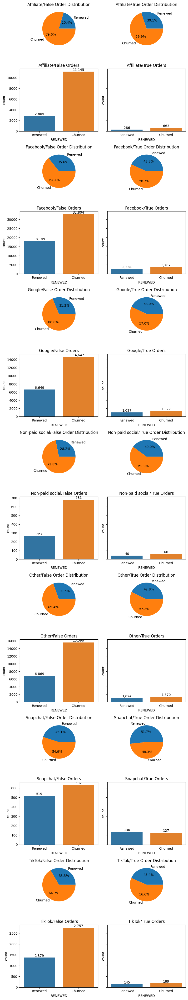

In [127]:
inspect_column_matrix(df,'RECENT_CHANNEL','ORDER_UPSELL',14,2,(8,42))

### Distribution by Shipping Method

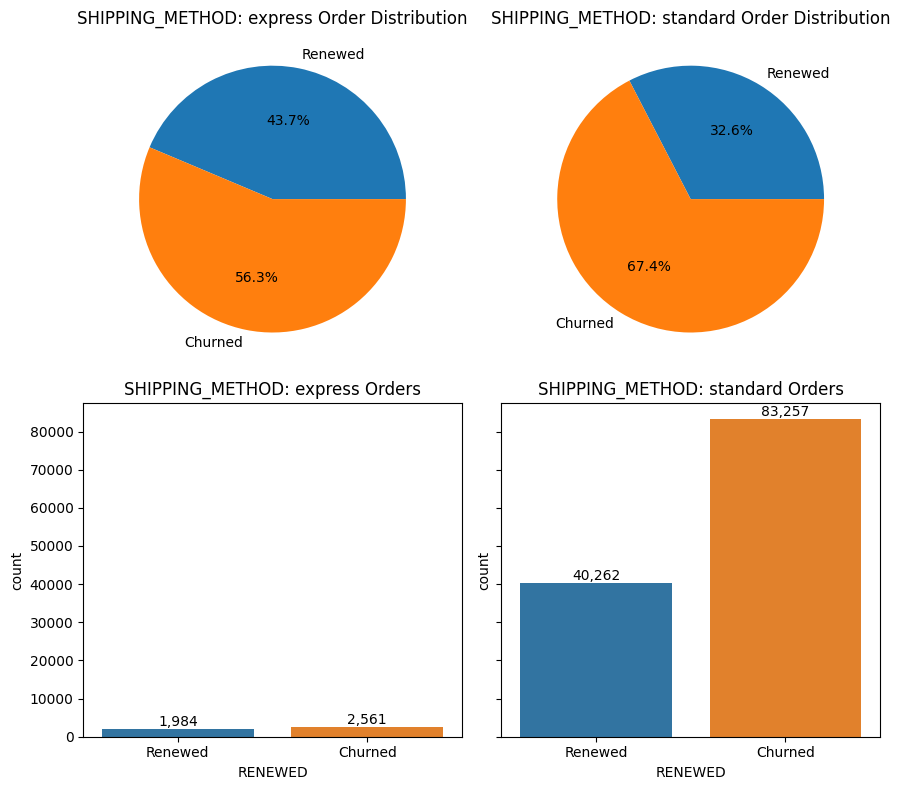

In [133]:
inspect_column(df,'SHIPPING_METHOD',2,2,(9, 8))

### Distribution by Shipping Method & Recent Channel

#### Findings:

* Users with express shipping are more likely to renew
* **Snapchat** users are more likely to use express shipping

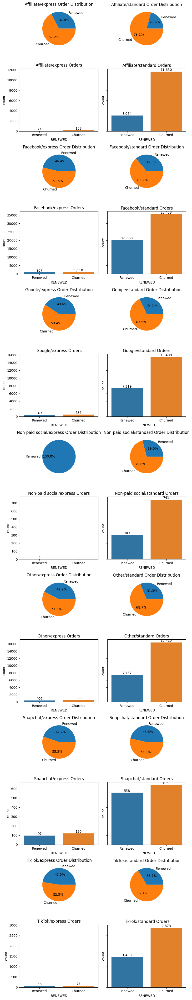

In [134]:
inspect_column_matrix(df,'RECENT_CHANNEL','SHIPPING_METHOD',14,2,(8,42))

### Distribution by Shipping Method & Region

#### Findings:

* Only **US** users are offered express shipping option for free trial

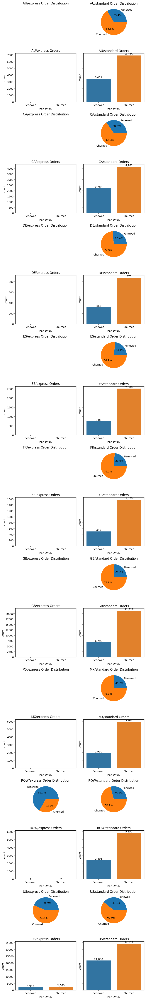

In [135]:
inspect_column_matrix(df,'FULFILLMENT_REGION','SHIPPING_METHOD',18,2,(8,54))

### Distribution by Having Post Purchase Survey

#### Findings:

* Users who have completed post purchase survey are more likely to renew

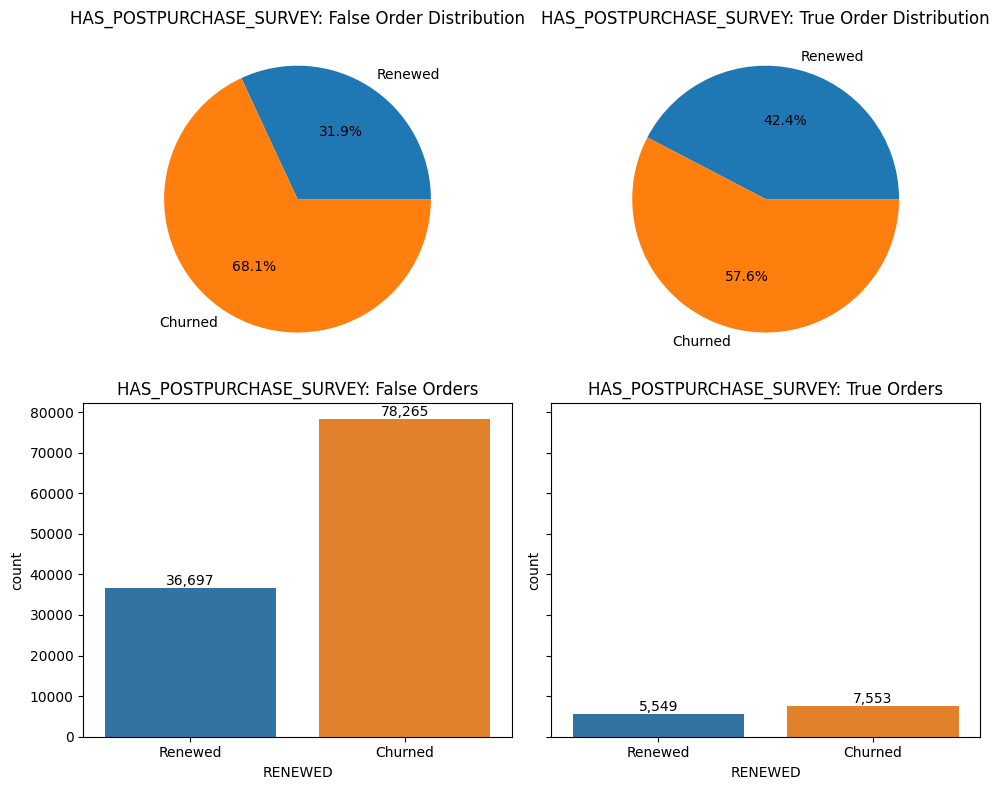

In [139]:
inspect_column(df,'HAS_POSTPURCHASE_SURVEY',2,2,(10, 8))

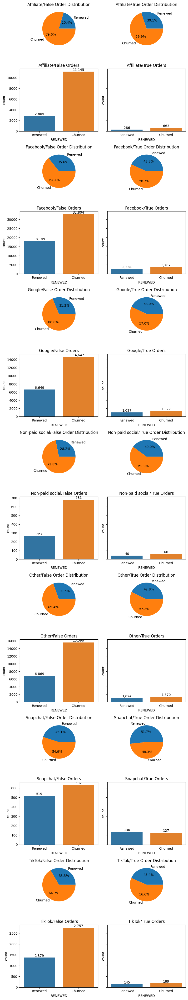

In [140]:
inspect_column_matrix(df,'RECENT_CHANNEL','HAS_POSTPURCHASE_SURVEY',14,2,(8,42))

### Expected Renewal Revenue Distribution

#### Findings:
* Most expected renewal revenue is in the $65-$80 range
* Outliers exisit in the dataset
* Bucketing revenue to mitigate the impact of outliers 
    * 0-$40: Very Low
    * $40-$65: Low
    * $65-$75: Medium
    * $75-$85: High
    * $85+: Very High

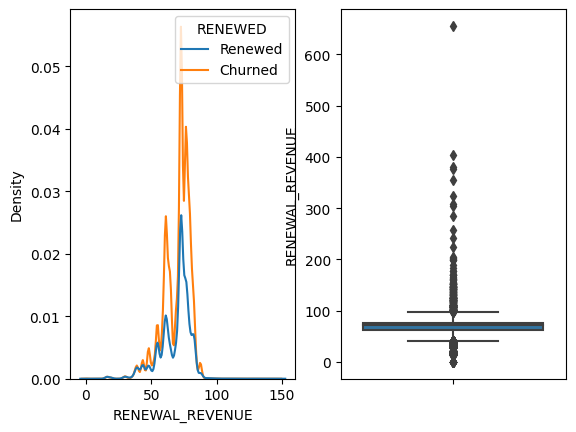

In [34]:
fig,ax=plt.subplots(1,2)
sns.kdeplot(data=df[df.RENEWAL_REVENUE<=150],x='RENEWAL_REVENUE',hue='RENEWED',hue_order=['Renewed','Churned'],ax=ax[0])
sns.boxplot(data=df,y='RENEWAL_REVENUE',hue='RENEWED',hue_order=['Renewed','Churned'],ax=ax[1])
plt.show()

In [35]:
bins=[-np.inf,40,65,75,85,np.inf]
label=['very low','low','medium','high','very high']
df['RENEWAL_REVENUE']=df['RENEWAL_REVENUE'].fillna(70)
df['REVENUE_GROUP']=pd.cut(df['RENEWAL_REVENUE'],bins=bins,labels=label)
df['REVENUE_GROUP']=df['REVENUE_GROUP'].astype('O')

#### Findings:
* Very low expected renewal revenue (0-$40) has the highest renewal rate
* High expected renewal revenue ($75-$85) has the lowest renewal rate
* Other expected renewal revenue ranges have average renewal rate

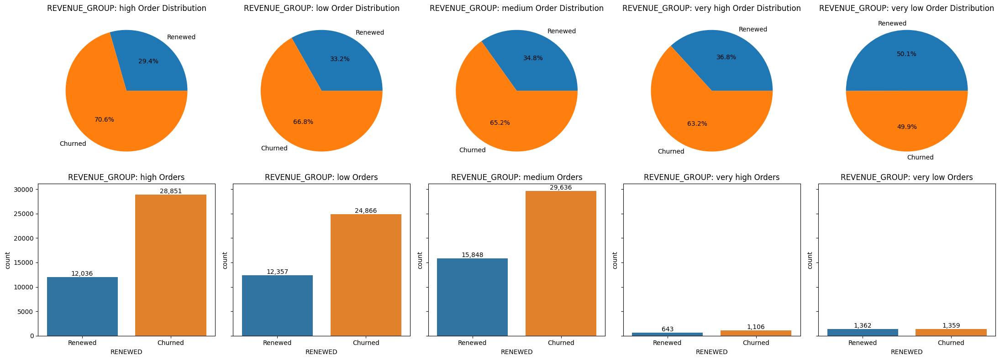

In [142]:
inspect_column(df,'REVENUE_GROUP',2,5,(22, 8))

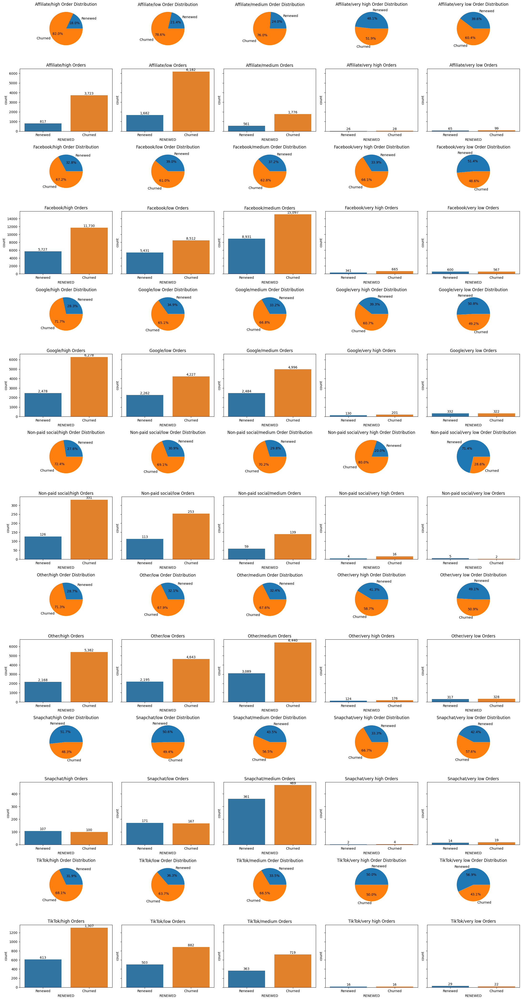

In [143]:
inspect_column_matrix(df,'RECENT_CHANNEL','REVENUE_GROUP',14,5,(22, 42))

## Data Preprocessing

* Preprocessing the raw data and converting the data into the format that machine learning algorithm can read
* Based on the analysis above, processing some features to decrease noise to the model 

##### Preprocessing Details

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline,FeatureUnion
from sklearn.preprocessing import MinMaxScaler, MultiLabelBinarizer, OneHotEncoder,FunctionTransformer,MaxAbsScaler
from sklearn.impute import SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin
from imblearn.over_sampling import RandomOverSampler


In [39]:
X0=df_raw.drop('RENEWED',axis=1)
y0=df_raw['RENEWED']
X1=df_raw[df_raw['CANCELLED_IN_1_DAY']==0].drop('RENEWED',axis=1)
y1=df_raw.loc[df_raw['CANCELLED_IN_1_DAY']==0,'RENEWED']
X7=df_raw[df_raw['CANCELLED_IN_7_DAY']==0].drop('RENEWED',axis=1)
y7=df_raw.loc[df_raw['CANCELLED_IN_7_DAY']==0,'RENEWED']
X14=df_raw[df_raw['CANCELLED_IN_14_DAYS']==0].drop('RENEWED',axis=1)
y14=df_raw.loc[df_raw['CANCELLED_IN_14_DAYS']==0,'RENEWED']

In [40]:
X_train0, X_test0, y_train0, y_test0 = train_test_split(X0, y0, test_size=0.25, random_state=99,stratify=y0)
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.25, random_state=100,stratify=y1)
X_train7, X_test7, y_train7, y_test7 = train_test_split(X7, y7, test_size=0.25, random_state=101,stratify=y7)
X_train14, X_test14, y_train14, y_test14 = train_test_split(X14, y14, test_size=0.25, random_state=102,stratify=y14)

In [41]:
X_test0_raw=X_test0.copy()
X_train0_raw=X_train0.copy()

In [42]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y_train0=le.fit_transform(y_train0)
y_test0=le.transform(y_test0)
y_train1=le.fit_transform(y_train1)
y_test1=le.transform(y_test1)
y_train7=le.fit_transform(y_train7)
y_test7=le.transform(y_test7)
y_train14=le.fit_transform(y_train14)
y_test14=le.transform(y_test14)

In [43]:
# sampler=RandomOverSampler(random_state=3,sampling_strategy='not majority')
# X_train,y_train=sampler.fit_resample(X_train ,y_train)

In [44]:
# construnct multilabel binarizer 
class BinarizerTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.mlb_dict={}

    def fit(self, X, y=None):
        X_fit=X.copy()
        for column in self.column:
            X_fit[column] = X_fit[column].apply(string_tolist)
            mlb=MultiLabelBinarizer()
            mlb.fit(X_fit[column])
            self.mlb_dict[column]=mlb
        return self

    def transform(self, X):
        X_transformed=X.copy()
        binarized_dfs = []
        for column in self.column:
            try:
                X_transformed[column] = X_transformed[column].apply(string_tolist)
            except:
                pass
            mlb = self.mlb_dict[column]
            binary_column = mlb.transform(X_transformed[column])
            binarized_df = pd.DataFrame(binary_column, columns=[column+' '+ issue for issue in mlb.classes_])
            X_transformed.drop(column,axis=1,inplace=True)
            binarized_dfs.append(binarized_df)
        X_transformed.reset_index(drop=True,inplace=True)
        return pd.concat([X_transformed]+binarized_dfs, axis=1)


In [45]:
class BinTransformer1(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.mean=0

    def fit(self,X,y=None):
        X_fit=X.copy()
        self.mean=np.mean(X_fit['RENEWAL_REVENUE'])
        return self
    
    def transform(self,X:pd.DataFrame):
        X_transformed=X.copy()
        bins=[-np.inf,40,65,75,85,np.inf]
        labels=['very low','low','medium','high','very high']
        X_transformed['RENEWAL_REVENUE'].fillna(self.mean,inplace=True)
        X_transformed['RENEWAL_REVENUE']=pd.cut(X_transformed['RENEWAL_REVENUE'],bins=bins,labels=labels)
        X_transformed['RENEWAL_REVENUE']= X_transformed['RENEWAL_REVENUE'].cat.codes
        return X_transformed

In [46]:
# class BinTransformer2(BaseEstimator, TransformerMixin):
#     def __init__(self):
#         self.mean=0

#     def fit(self,X,y=None):
#         return self
    
#     def transform(self,X:pd.DataFrame):
#         X_transformed=X.copy()
#         X_transformed['EVENTS_AFTER_ORDER']=np.where(X_transformed['EVENTS_AFTER_ORDER']==1,1,0)
#         return X_transformed

In [47]:
# def visit_clean(df):
#     df['DELIVER_TO_LAST_VIST']=round((df['LAST_ACCOUT_VIST']-df['DELIVERED_AT'])/np.timedelta64(1,'D'),0)
#     df['DELIVER_TO_ACCOUNT']=np.where(df['FIRST_ACCOUT_VIST'].isna(),'No Visit',
#                              np.where((df['DELIVER_TO_LAST_VIST']>=0)&(df['DELIVER_TO_LAST_VIST']<=3),'Visit within 3 Days',
#                              np.where((df['DELIVER_TO_LAST_VIST']<0),'Visit Before Delivery','Visit After 3 Days of Delivery')))
#     df['VISITED_SUBSCRIPTION_PAGE']=np.where(df['FIRST_SUBSCRIPTION_VIST'].isna(),0,1)
#     df['VISITED_HOW_TO']=np.where(df['VISITED_HOW_TO']>0,1,0)
#     df['VISITED_ACCOUNT_CREATION']=np.where(df['VISITED_ACCOUNT_CREATION']>0,1,0)
#     df=df.drop(['DELIVERED_AT','FIRST_ACCOUT_VIST','LAST_ACCOUT_VIST','FIRST_SUBSCRIPTION_VIST','LAST_SUBSCRIPTION_VIST','CREATED_AT','DELIVER_TO_LAST_VIST'],axis=1)
#     return df

In [48]:
## Drop columns not in use
X_train0.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_test0.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_train1.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_test1.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_train7.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_test7.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_train14.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)
X_test14.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1,inplace=True)

In [49]:
## Impute missing value
Imputer=SimpleImputer(strategy='most_frequent')
X_train0=pd.DataFrame(Imputer.fit_transform(X_train0),columns=Imputer.get_feature_names_out())
X_test0=pd.DataFrame(Imputer.transform(X_test0),columns=Imputer.get_feature_names_out())
X_train1=pd.DataFrame(Imputer.transform(X_train1),columns=Imputer.get_feature_names_out())
X_test1=pd.DataFrame(Imputer.transform(X_test1),columns=Imputer.get_feature_names_out())
X_train7=pd.DataFrame(Imputer.transform(X_train7),columns=Imputer.get_feature_names_out())
X_test7=pd.DataFrame(Imputer.transform(X_test7),columns=Imputer.get_feature_names_out())
X_train14=pd.DataFrame(Imputer.transform(X_train14),columns=Imputer.get_feature_names_out())
X_test14=pd.DataFrame(Imputer.transform(X_test14),columns=Imputer.get_feature_names_out())

In [50]:
X_train0['RENEWAL_REVENUE']=X_train0['RENEWAL_REVENUE'].astype('float')
X_test0['RENEWAL_REVENUE']=X_test0['RENEWAL_REVENUE'].astype('float')
X_train1['RENEWAL_REVENUE']=X_train1['RENEWAL_REVENUE'].astype('float')
X_test1['RENEWAL_REVENUE']=X_test1['RENEWAL_REVENUE'].astype('float')
X_train7['RENEWAL_REVENUE']=X_train7['RENEWAL_REVENUE'].astype('float')
X_test7['RENEWAL_REVENUE']=X_test7['RENEWAL_REVENUE'].astype('float')
X_train14['RENEWAL_REVENUE']=X_train14['RENEWAL_REVENUE'].astype('float')
X_test14['RENEWAL_REVENUE']=X_test14['RENEWAL_REVENUE'].astype('float')

In [51]:
## Group similar region
region_map={'US':'US','GB':'EU_MX','MX':'EU_MX','ROW':'ROW','DE':'EU_MX','FR':'EU_MX','ES':'EU_MX','AU':'AU_CA','CA':'AU_CA'}
X_train0['FULFILLMENT_REGION']=X_train0['FULFILLMENT_REGION'].map(region_map)
X_test0['FULFILLMENT_REGION']=X_test0['FULFILLMENT_REGION'].map(region_map)
X_train1['FULFILLMENT_REGION']=X_train1['FULFILLMENT_REGION'].map(region_map)
X_test1['FULFILLMENT_REGION']=X_test1['FULFILLMENT_REGION'].map(region_map)
X_train7['FULFILLMENT_REGION']=X_train7['FULFILLMENT_REGION'].map(region_map)
X_test7['FULFILLMENT_REGION']=X_test7['FULFILLMENT_REGION'].map(region_map)
X_train14['FULFILLMENT_REGION']=X_train14['FULFILLMENT_REGION'].map(region_map)
X_test14['FULFILLMENT_REGION']=X_test14['FULFILLMENT_REGION'].map(region_map)

In [52]:
BT=BinarizerTransformer(['WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE','WHICH_PRODUCTS_DO_YOU_USE_NOW'])
X_train0=BT.fit_transform(X_train0)
X_test0=BT.transform(X_test0)
X_train1=BT.transform(X_train1)
X_test1=BT.transform(X_test1)
X_train7=BT.transform(X_train7)
X_test7=BT.transform(X_test7)
X_train14=BT.transform(X_train14)
X_test14=BT.transform(X_test14)

In [53]:
# ## Process list variable
# X_train0=binarizer(X_train0,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_train0=binarizer(X_train0,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_test0=binarizer(X_test0,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_test0=binarizer(X_test0,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_train1=binarizer(X_train1,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_train1=binarizer(X_train1,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_test1=binarizer(X_test1,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_test1=binarizer(X_test1,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_train7=binarizer(X_train7,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_train7=binarizer(X_train7,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_test7=binarizer(X_test7,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_test7=binarizer(X_test7,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_train14=binarizer(X_train14,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_train14=binarizer(X_train14,'WHICH_PRODUCTS_DO_YOU_USE_NOW')
# X_test14=binarizer(X_test14,'WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE')
# X_test14=binarizer(X_test14,'WHICH_PRODUCTS_DO_YOU_USE_NOW')

In [54]:
## Group quiz ansnwers
X_train0['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_train0['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_test0['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_test0['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_train1['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_train1['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_test1['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_test1['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_train7['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_train7['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_test7['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_test7['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_train14['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_train14['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
X_test14['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=X_test14['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)

In [55]:
## Get low budget users
willingness_map={'Unknown':0,'10_20':1,'Not_Sure':2,'20_30':2,'30_40':3,'More_Than_50':3}
X_train0['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_train0['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_test0['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_test0['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_train1['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_train1['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_test1['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_test1['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_train7['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_train7['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_test7['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_test7['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_train14['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_train14['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
X_test14['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=X_test14['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)

In [56]:
## Users age group
age_map={'Unknown':0,'13-24':1,'25-34':2,'35-45':3, '46-55':4,'56':4}
X_train0['HOW_OLD_ARE_YOU']=X_train0['HOW_OLD_ARE_YOU'].map(age_map)
X_test0['HOW_OLD_ARE_YOU']=X_test0['HOW_OLD_ARE_YOU'].map(age_map)
X_train1['HOW_OLD_ARE_YOU']=X_train1['HOW_OLD_ARE_YOU'].map(age_map)
X_test1['HOW_OLD_ARE_YOU']=X_test1['HOW_OLD_ARE_YOU'].map(age_map)
X_train7['HOW_OLD_ARE_YOU']=X_train7['HOW_OLD_ARE_YOU'].map(age_map)
X_test7['HOW_OLD_ARE_YOU']=X_test7['HOW_OLD_ARE_YOU'].map(age_map)
X_train14['HOW_OLD_ARE_YOU']=X_train14['HOW_OLD_ARE_YOU'].map(age_map)
X_test14['HOW_OLD_ARE_YOU']=X_test14['HOW_OLD_ARE_YOU'].map(age_map)

In [57]:
## label expected speed
speed_map={'In A Few Weeks':3, 'Unknown':0, 'Right Away':1, 'In A Few Days':2,
       'Not_Sure':5, 'In A Few Months':4}
X_train0.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_train0.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_test0.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_test0.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_train1.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_train1.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_test1.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_test1.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_train7.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_train7.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_test7.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_test7.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_train14.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_train14.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
X_test14.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=X_test14.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)

In [58]:
## transform boolen variables
bool_cols=['ORDER_UPSELL','HAS_POSTPURCHASE_SURVEY']
X_train0[bool_cols]=X_train0[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_test0[bool_cols]=X_test0[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_train1[bool_cols]=X_train1[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_test1[bool_cols]=X_test1[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_train7[bool_cols]=X_train7[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_test7[bool_cols]=X_test7[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_train14[bool_cols]=X_train14[bool_cols].apply(lambda x:x.map({False:0,True:1}))
X_test14[bool_cols]=X_test14[bool_cols].apply(lambda x:x.map({False:0,True:1}))

In [59]:
## transform other categorical cols
cat_cols=['RECENT_CHANNEL','SHIPPING_METHOD','WHAT_IS_YOUR_SKIN_TYPE','GENDER','FULFILLMENT_REGION']
OHE=OneHotEncoder(drop='first')
X_train0=pd.concat([pd.DataFrame(OHE.fit_transform(X_train0[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_train0.drop(cat_cols,axis=1)],axis=1)
X_test0=pd.concat([pd.DataFrame(OHE.transform(X_test0[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_test0.drop(cat_cols,axis=1)],axis=1)
X_train1=pd.concat([pd.DataFrame(OHE.transform(X_train1[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_train1.drop(cat_cols,axis=1)],axis=1)
X_test1=pd.concat([pd.DataFrame(OHE.transform(X_test1[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_test1.drop(cat_cols,axis=1)],axis=1)
X_train7=pd.concat([pd.DataFrame(OHE.transform(X_train7[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_train7.drop(cat_cols,axis=1)],axis=1)
X_test7=pd.concat([pd.DataFrame(OHE.transform(X_test7[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_test7.drop(cat_cols,axis=1)],axis=1)
X_train14=pd.concat([pd.DataFrame(OHE.transform(X_train14[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_train14.drop(cat_cols,axis=1)],axis=1)
X_test14=pd.concat([pd.DataFrame(OHE.transform(X_test14[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),X_test14.drop(cat_cols,axis=1)],axis=1)

In [60]:
print(X_train0.shape)
print(y_train0.shape)

(96048, 42)
(96048,)


In [61]:
print(X_train1.shape)
print(y_train1.shape)

(88369, 42)
(88369,)


In [62]:
print(X_train7.shape)
print(y_train7.shape)

(76612, 42)
(76612,)


In [63]:
print(X_train14.shape)
print(y_train14.shape)

(62052, 42)
(62052,)


## Modeling

### Modeling Details

In [64]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
import xgboost
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,roc_curve,roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
import graphviz
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

In [65]:
def model_evaluation(model,X_train0,y_train0,X_test0,y_test0):
    print('train: ',model.score(X_train0,y_train0))
    print('test: ',model.score(X_test0,y_test0))
    y_pred_proba = model.predict_proba(X_test0)[::,1]
    fpr, tpr, _ = roc_curve(y_test0,  y_pred_proba)
    auc = roc_auc_score(y_test0, y_pred_proba)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.plot(np.linspace(0, 1, 100),  np.linspace(0, 1, 100), linestyle='--', color='r', label='Random Guessing')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()


In [66]:
xgb0=XGBClassifier(objective='reg:logistic', n_estimators=500,seed=123,gamma=5,reg_lambda=15,learning_rate=0.05,max_depth=30,colsample_bylevel=0.8)
xgb0.fit(X_train0,y_train0)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.8, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=30, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              objective='reg:logistic', predictor=None, ...)

### Model Genderal Evaluation

* AUC Score represents how well the model can distinguish **Renewed** and **Churned** users
    * AUC=1: perfect model
    * AUC=0: worst model
    * AUC=0.5: random guessing
* Our model is not optimal, but still 30% better than random guessing

train:  0.71990046643345
test:  0.6746939030484758


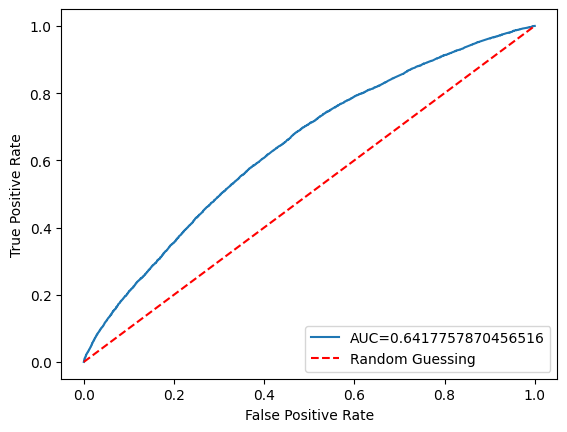

In [67]:
model_evaluation(xgb0,X_train0,y_train0,X_test0,y_test0)

### Feature Importance

####  Feature importance is generated by the model and it refers to the degree of impact that each feature has on the predictions made by the machine learning model
* Region **EU, MX** has the largest impact, those regions have large volumes and lower renewal rate
* Region **US** has the second largest impact, US has large volumes and high renewal rate
* **Gender**, **Willingness to Pay** and **Age** are most important quiz questions
* Variables with small number of samples tend to have smaller importance

In [68]:
importance_df=pd.DataFrame({'Variables':X_test0.columns, 'Importance Score':xgb0.feature_importances_})
importance_df=importance_df[~importance_df.Variables.str.contains('Unknown')]
importance_df.sort_values('Importance Score',ascending=False)

,Variables,Importance Score
15,FULFILLMENT_REGION_EU_MX,0.180421
17,FULFILLMENT_REGION_US,0.114462
12,GENDER_Male,0.063119
21,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,0.034213
22,HOW_OLD_ARE_YOU,0.033960
0,RECENT_CHANNEL_Facebook,0.029584
3,RECENT_CHANNEL_Other,0.025586
19,HAS_POSTPURCHASE_SURVEY,0.021006
20,ORDER_UPSELL,0.020764
1,RECENT_CHANNEL_Google,0.020584


### Construct Predict Function

In [69]:
def get_renew_prob(X):
    x=X.copy()
    x.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS','RENEWED'],axis=1,inplace=True)
    x=pd.DataFrame(Imputer.transform(x),columns=Imputer.get_feature_names_out())
    x['RENEWAL_REVENUE']=x['RENEWAL_REVENUE'].astype('float')
    x['FULFILLMENT_REGION']=x['FULFILLMENT_REGION'].map(region_map)
    x=BT.transform(x)
    x['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU']=x['DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU'].apply(lambda x: 2 if 'Yes' in x else 0 if 'No' in x else 1)
    x['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS']=x['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map)
    x['HOW_OLD_ARE_YOU']=x['HOW_OLD_ARE_YOU'].map(age_map)
    x.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT=x.WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT.map(speed_map)
    x[bool_cols]=x[bool_cols].apply(lambda x:x.map({False:0,True:1}))
    x=pd.concat([pd.DataFrame(OHE.transform(x[cat_cols]).toarray(),columns=OHE.get_feature_names_out()),x.drop(cat_cols,axis=1)],axis=1)
    d0_probs=xgb0.predict_proba(x)[:,1].reshape(-1,1)
    X_output=X.drop(['CREATED_AT','COUNTRY_CODE','COMPLETE_HDYHAU','DMA','WHO_ARE_YOU_BUYING_FOR_TODAY','HOW_SENSITIVE_IS_YOUR_SKIN','WHAT_IS_YOUR_TOP_SKINCARE_CONCERN','ORDER_TO_DELIVER','DELIVERED_AT','VISITED_HOW_TO','VISITED_ACCOUNT_CREATION','FIRST_ACCOUT_VISIT', 'LAST_ACCOUT_VISIT',
       'FIRST_SUBSCRIPTION_VISIT', 'LAST_SUBSCRIPTION_VISIT','WHICH_OF_THE_FOLLOWING_BRANDS_DO_YOU_USE_NOW','HOW_IMPORTANT_IS_ADDRESSING_YOUR_TOP_SKINCARE_CONCERN_RIGHT_NOW','WHICH_SCENARIO_BEST_DESCRIBES_YOUR_DAILY_SKINCARE_REGIMEN','FINISHED_FT_QUIZ','CANCELLED_IN_1_DAY','CANCELLED_IN_7_DAY','CANCELLED_IN_14_DAYS'],axis=1)
    X_output['Renewal Probability']=d0_probs
    return X_output
    

### Example

In [70]:
df_sample=df_raw.sample(5,random_state=1)

In [71]:
get_renew_prob(df_sample)

,RENEWAL_REVENUE,FULFILLMENT_REGION,RECENT_CHANNEL,HAS_POSTPURCHASE_SURVEY,ORDER_UPSELL,SHIPPING_METHOD,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,GENDER,HOW_OLD_ARE_YOU,WHAT_IS_YOUR_SKIN_TYPE,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE,WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT,WHICH_PRODUCTS_DO_YOU_USE_NOW,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU,RENEWED,Renewal Probability
75609,72.30,GB,Facebook,True,True,standard,Not_Sure,Male,46-55,Dry,"[\n ""Dry Skin"",\n ""Overall Skin Health"",\n ""Acne Scars"",\n ""Wrinkles""\n]",In A Few Days,"[\n ""Other""\n]","[\n ""Still Figuring It Out""\n]",Renewed,0.520249
25833,76.72,GB,Facebook,False,False,standard,20_30,Male,35-45,Dry,"[\n ""Overall Skin Health"",\n ""Wrinkles"",\n ""Looking Tired""\n]",In A Few Weeks,"[\n ""Exfoliator"",\n ""Moisturizer""\n]","[\n ""Yes Mostly"",\n ""Yes""\n]",Churned,0.285552
26795,81.52,MX,Other,False,False,standard,More_Than_50,Male,25-34,Oily,"[\n ""Acne Scars"",\n ""Oily Skin"",\n ""Dark Circles"",\n ""Uneven Tone""\n]",In A Few Weeks,"[\n ""I Dont Use Any Products""\n]","[\n ""No""\n]",Churned,0.190267
103030,68.40,US,Facebook,False,False,standard,10_20,Male,25-34,Combination,"[\n ""Uneven Tone"",\n ""Not_Sure"",\n ""Oily Skin"",\n ""Looking Tired"",\n ""Acne Scars"",\n ""Dark Circles"",\n ""Overall Skin Health"",\n ""Wrinkles"",\n ""Sun Damage"",\n ""Dry Skin""\n]",In A Few Weeks,"[\n ""Cleanser"",\n ""Exfoliator"",\n ""Other"",\n ""Moisturizer""\n]","[\n ""Still Figuring It Out""\n]",Churned,0.344786
117328,61.20,US,Facebook,False,False,standard,Not_Sure,Male,25-34,Dry,"[\n ""Dark Circles"",\n ""Dry Skin"",\n ""Looking Tired"",\n ""Wrinkles"",\n ""Sun Damage"",\n ""Uneven Tone""\n]",In A Few Days,"[\n ""I Dont Use Any Products""\n]","[\n ""Yes"",\n ""Yes Mostly""\n]",Churned,0.417180


## Output Evaluation/Analysis

### Model Prediction vs. Actual Renewal Rate

#### Comments:
* The model's prediction is aligned with the actual renew rate
* The tends to give mid-range percentages because of the uncertainties in the data


In [91]:
y_probs = xgb0.predict_proba(X_test0)
prob_class0=pd.DataFrame(np.append(y_test0.reshape(-1,1),y_probs[:,1].reshape(-1,1),axis=1),columns=['Class','Prob'])
prob_class0['Renew_Prob_Group']=pd.cut(x=prob_class0['Prob'],bins=np.linspace(0,1,11),labels=['0-10%','10-20%','20-30%','30-40%','40-50%','50-60%','60-70%','70-80%','80-90%','90-100%'])
by_prob_group=prob_class0.groupby('Renew_Prob_Group').agg({'Class':['count','sum']})
by_prob_group.columns=['Users','Renewed']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users']).apply(lambda x:f'{x:.1%}')
by_prob_group

,Users,Renewed,Actual Renew Rate
Renew_Prob_Group,,,
0-10%,111,13.0,11.7%
10-20%,5616,1018.0,18.1%
20-30%,8415,2142.0,25.5%
30-40%,8410,3040.0,36.1%
40-50%,5883,2485.0,42.2%
50-60%,2753,1377.0,50.0%
60-70%,692,387.0,55.9%
70-80%,100,74.0,74.0%
80-90%,33,23.0,69.7%


#### Questions:

* Which cohorts of users should we target?
    * Users with low probability to renew (0 - 10%): small volume, low retention rate
    * Users with low to medium probability to renew (10 - 30%): largest volume, below average retention rate
    * Users with medium probability to renew (30 - 40%): large volume, average retention rate
    * Users with medium to high probability to renew (40 - 50%): medium volume, above average retention rate
    * Users with high probability to renew (50% +): small volume, high retention rate
* When should we send the offer to the users?
    

### Model Output Distribution

#### Predicted Renewal Probability vs. Actual Renewal Rate by Region

* Note: Colors in the heatmap represent volume
    * Darker color -> higher volume

#### Findings:
* Predicted renewal probabilities are aligned with actual renewal rates in all regions for most cohorts
* Higher predicted renewal probabililies also mean higher LTV
* Exceptions appear more in high probability cohorts because smaller volume of users are given high renewal probability
* MX, GB, FR, ES have low LTV but high AOV in the lower probability group (10%-30%)

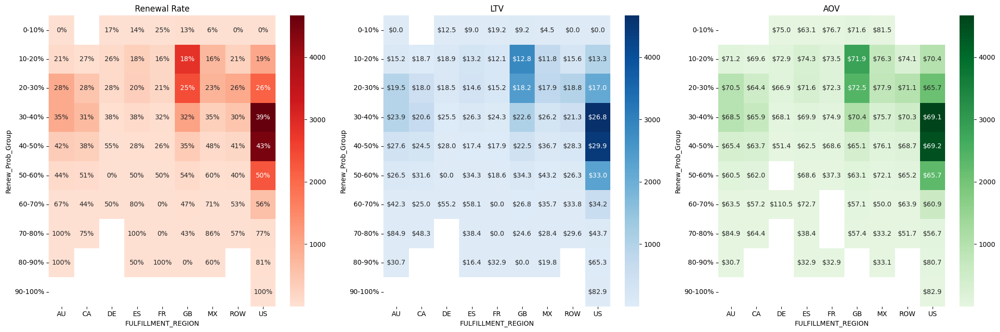

In [92]:
X_test0_raw.reset_index(drop=True,inplace=True)
df_pred=pd.concat([X_test0_raw,prob_class0],axis=1)
df_pred['Revenue']=df_pred['RENEWAL_REVENUE']*df_pred['Class']
by_prob_group=df_pred.groupby(['FULFILLMENT_REGION','Renew_Prob_Group']).agg({'Class':['count','sum'],'Revenue':'sum'})
by_prob_group.columns=['Users','Renewed','Total Revenue']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users'])
by_prob_group['LTV']=(by_prob_group['Total Revenue']/by_prob_group['Users'])
by_prob_group['AOV']=(by_prob_group['Total Revenue']/by_prob_group['Renewed'])
by_prob_group.reset_index(inplace=True)
pivot_prob_group=by_prob_group.pivot(columns='FULFILLMENT_REGION',index='Renew_Prob_Group',values='Actual Renew Rate')
pivot_user_group=by_prob_group.pivot(columns='FULFILLMENT_REGION',index='Renew_Prob_Group',values='Users')
pivot_ltv_group=by_prob_group.pivot(columns='FULFILLMENT_REGION',index='Renew_Prob_Group',values='LTV')
pivot_aov_group=by_prob_group.pivot(columns='FULFILLMENT_REGION',index='Renew_Prob_Group',values='AOV')
pivot_ltv_group_annot=pivot_ltv_group.applymap(lambda x: f'${x:.1f}')
mask1=pivot_aov_group.isnull()
pivot_aov_group_annot=pivot_aov_group.applymap(lambda x: f'${x:.1f}')
mask=pivot_prob_group.isnull()
fig,ax=plt.subplots(1,3,figsize=(21, 7))
sns.heatmap(pivot_user_group, annot=pivot_prob_group,  cmap='Reds', fmt='.0%',mask=mask,center=2000,ax=ax[0])
sns.heatmap(pivot_user_group, annot=pivot_ltv_group_annot,  fmt='',cmap='Blues',mask=mask,ax=ax[1],center=2000)
sns.heatmap(pivot_user_group, annot=pivot_aov_group_annot,  fmt='',cmap='Greens',mask=mask1,ax=ax[2],center=2000)
ax[0].set_title('Renewal Rate')
ax[1].set_title('LTV')
ax[2].set_title('AOV')
plt.tight_layout()
plt.show()

#### Predicted Renewal Probability vs. Actual Renewal Rate by Channel

* Predicted renewal probabilities are aligned with actual renewal rates for all major channels
* **Snapchat** (small volume) has high renewal rate, LTV and AOV
* **Affiliate** has much lower LTV and AOV

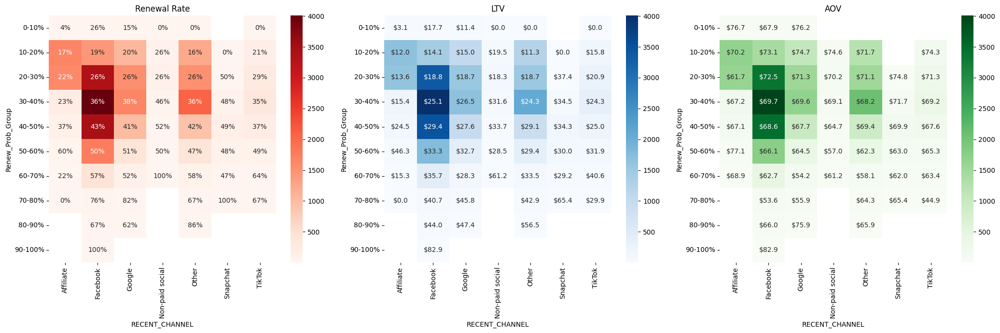

In [93]:
by_prob_group=df_pred.groupby(['RECENT_CHANNEL','Renew_Prob_Group']).agg({'Class':['count','sum'],'Revenue':'sum'})
by_prob_group.columns=['Users','Renewed','Total Revenue']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users'])
by_prob_group['LTV']=(by_prob_group['Total Revenue']/by_prob_group['Users'])
by_prob_group['AOV']=(by_prob_group['Total Revenue']/by_prob_group['Renewed'])
by_prob_group.reset_index(inplace=True)
pivot_prob_group=by_prob_group.pivot(columns='RECENT_CHANNEL',index='Renew_Prob_Group',values='Actual Renew Rate')
pivot_user_group=by_prob_group.pivot(columns='RECENT_CHANNEL',index='Renew_Prob_Group',values='Users')
pivot_ltv_group=by_prob_group.pivot(columns='RECENT_CHANNEL',index='Renew_Prob_Group',values='LTV')
pivot_aov_group=by_prob_group.pivot(columns='RECENT_CHANNEL',index='Renew_Prob_Group',values='AOV')
pivot_ltv_group_annot=pivot_ltv_group.applymap(lambda x: f'${x:.1f}')
mask1=pivot_aov_group.isnull()
pivot_aov_group_annot=pivot_aov_group.applymap(lambda x: f'${x:.1f}')
mask=pivot_prob_group.isnull()
fig,ax=plt.subplots(1,3,figsize=(21, 7))
sns.heatmap(pivot_user_group, annot=pivot_prob_group,  cmap='Reds', fmt='.0%',mask=mask,center=2000,ax=ax[0])
sns.heatmap(pivot_user_group, annot=pivot_ltv_group_annot,  fmt='',cmap='Blues',mask=mask,ax=ax[1],center=2000)
sns.heatmap(pivot_user_group, annot=pivot_aov_group_annot,  fmt='',cmap='Greens',mask=mask1,ax=ax[2],center=2000)
ax[0].set_title('Renewal Rate')
ax[1].set_title('LTV')
ax[2].set_title('AOV')
plt.tight_layout()
plt.show()

#### Predicted Renewal Probability vs. Actual Renewal Rate by Age

* Age is one of the most important quiz questions
    * Bigger age -> Higher renewal rate, LTV
* 46+ users don't necessarily have higher AOV in the lower probability group, but do have higher AOV in the higher probability group

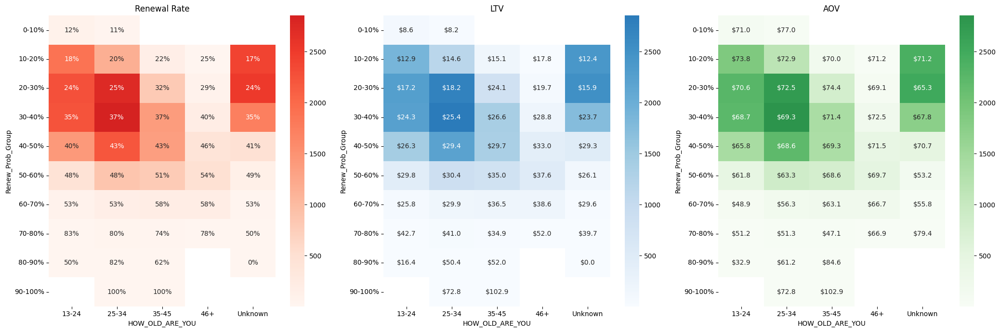

In [94]:
age_map1={'Unknown':'Unknown','13-24':'13-24','25-34':'25-34','35-45':'35-45', '46-55':'46+','56':'46+'}
df_pred['HOW_OLD_ARE_YOU']=df_pred['HOW_OLD_ARE_YOU'].map(age_map1)
by_prob_group=df_pred.groupby(['HOW_OLD_ARE_YOU','Renew_Prob_Group']).agg({'Class':['count','sum'],'Revenue':'sum'})
by_prob_group.columns=['Users','Renewed','Total Revenue']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users'])
by_prob_group['LTV']=(by_prob_group['Total Revenue']/by_prob_group['Users'])
by_prob_group['AOV']=(by_prob_group['Total Revenue']/by_prob_group['Renewed'])
by_prob_group.reset_index(inplace=True)
pivot_prob_group=by_prob_group.pivot(columns='HOW_OLD_ARE_YOU',index='Renew_Prob_Group',values='Actual Renew Rate')
pivot_user_group=by_prob_group.pivot(columns='HOW_OLD_ARE_YOU',index='Renew_Prob_Group',values='Users')
pivot_ltv_group=by_prob_group.pivot(columns='HOW_OLD_ARE_YOU',index='Renew_Prob_Group',values='LTV')
pivot_aov_group=by_prob_group.pivot(columns='HOW_OLD_ARE_YOU',index='Renew_Prob_Group',values='AOV')
pivot_ltv_group_annot=pivot_ltv_group.applymap(lambda x: f'${x:.1f}')
mask1=pivot_aov_group.isnull()
pivot_aov_group_annot=pivot_aov_group.applymap(lambda x: f'${x:.1f}')
mask=pivot_prob_group.isnull()
fig,ax=plt.subplots(1,3,figsize=(21, 7))
sns.heatmap(pivot_user_group, annot=pivot_prob_group,  cmap='Reds', fmt='.0%',mask=mask,center=2000,ax=ax[0])
sns.heatmap(pivot_user_group, annot=pivot_ltv_group_annot,  fmt='',cmap='Blues',mask=mask,ax=ax[1],center=2000)
sns.heatmap(pivot_user_group, annot=pivot_aov_group_annot,  fmt='',cmap='Greens',mask=mask1,ax=ax[2],center=2000)
ax[0].set_title('Renewal Rate')
ax[1].set_title('LTV')
ax[2].set_title('AOV')
plt.tight_layout()
plt.show()

#### Predicted Renewal Probability vs. Actual Renewal Rate by Willingness to Pay

* Predicted renewal probabilities are aligned with renewal rate for all level of Willingness to Pay 
* High Willingness to Pay cohort has higher LTV, AOV and renewal rate across the board

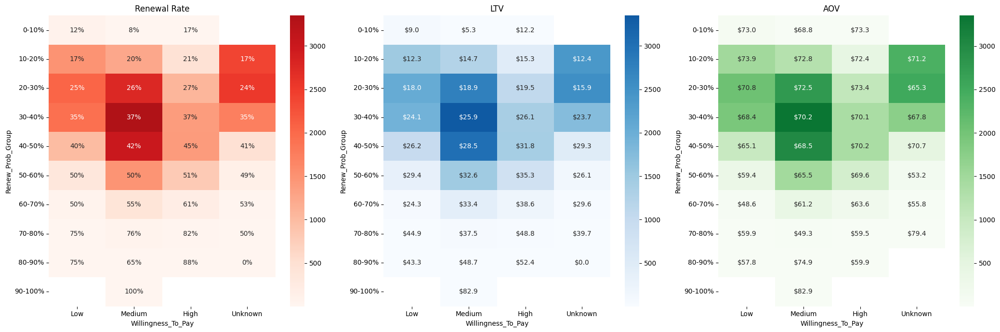

In [96]:
willingness_map1={'Unknown':'Unknown','10_20':'Low','Not_Sure':'Medium','20_30':'Medium','30_40':'High','More_Than_50':'High'}
df_pred['Willingness_To_Pay']=df_pred['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].map(willingness_map1)
by_prob_group=df_pred.groupby(['Willingness_To_Pay','Renew_Prob_Group']).agg({'Class':['count','sum'],'Revenue':'sum'})
by_prob_group.columns=['Users','Renewed','Total Revenue']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users'])
by_prob_group['LTV']=(by_prob_group['Total Revenue']/by_prob_group['Users'])
by_prob_group['AOV']=(by_prob_group['Total Revenue']/by_prob_group['Renewed'])
by_prob_group.reset_index(inplace=True)
pivot_prob_group=by_prob_group.pivot(columns='Willingness_To_Pay',index='Renew_Prob_Group',values='Actual Renew Rate')
pivot_user_group=by_prob_group.pivot(columns='Willingness_To_Pay',index='Renew_Prob_Group',values='Users')
pivot_ltv_group=by_prob_group.pivot(columns='Willingness_To_Pay',index='Renew_Prob_Group',values='LTV')
pivot_aov_group=by_prob_group.pivot(columns='Willingness_To_Pay',index='Renew_Prob_Group',values='AOV')
pivot_prob_group=pivot_prob_group.reindex(['Low','Medium','High','Unknown'], axis=1)
pivot_user_group=pivot_user_group.reindex(['Low','Medium','High','Unknown'], axis=1)
pivot_ltv_group=pivot_ltv_group.reindex(['Low','Medium','High','Unknown'], axis=1)
pivot_aov_group=pivot_aov_group.reindex(['Low','Medium','High','Unknown'], axis=1)
pivot_ltv_group_annot=pivot_ltv_group.applymap(lambda x: f'${x:.1f}')
mask1=pivot_aov_group.isnull()
pivot_aov_group_annot=pivot_aov_group.applymap(lambda x: f'${x:.1f}')
mask=pivot_prob_group.isnull()
fig,ax=plt.subplots(1,3,figsize=(21, 7))
sns.heatmap(pivot_user_group, annot=pivot_prob_group,  cmap='Reds', fmt='.0%',mask=mask,center=2000,ax=ax[0])
sns.heatmap(pivot_user_group, annot=pivot_ltv_group_annot,  fmt='',cmap='Blues',mask=mask,ax=ax[1],center=2000)
sns.heatmap(pivot_user_group, annot=pivot_aov_group_annot,  fmt='',cmap='Greens',mask=mask1,ax=ax[2],center=2000)
ax[0].set_title('Renewal Rate')
ax[1].set_title('LTV')
ax[2].set_title('AOV')
plt.tight_layout()
plt.show()

## Next Steps

* Revisit quiz questions based on the question importance
* Ads targeting at older users
* Make upsell/express shipping available for more users
* A/B testing on which cohort we should send offer to/ when we should send the offer/How much discount we should give out
* Retrain the model with better data\21 day FT data

# Construction Zone

#### US Predicted Renewal Probability vs. Actual Renewal Rate by Channel by Willingness to Pay

* We might want to target:
    * Facebook Medium Willingness to Spend 20-30% group (117 users, $18.99 LTV)
    * Google Low Willingness to Spend 20-30%(125 users, $18.72 LTV),

In [209]:

by_prob_group=df_pred[df_pred.FULFILLMENT_REGION=='US'].groupby(['RECENT_CHANNEL','Willingness_To_Pay','Renew_Prob_Group']).agg({'Class':['count','sum'],'Revenue':'sum'})
by_prob_group.columns=['Users','Renewed','Revenue']
by_prob_group['Actual Renew Rate']=(by_prob_group['Renewed']/by_prob_group['Users']).apply(lambda x:f'{x:.1%}')
by_prob_group.reset_index(inplace=True)
pivot_prob_group=by_prob_group.pivot(columns=['RECENT_CHANNEL','Willingness_To_Pay'],index='Renew_Prob_Group',values='Actual Renew Rate')
pivot_prob_group.replace('nan%','',inplace=True)
pivot_prob_group.reindex(['Low','Medium','High','Unknown'], axis=1,level=1)

RECENT_CHANNEL     Affiliate                       Facebook                  \
Willingness_To_Pay       Low Medium   High Unknown      Low  Medium    High   
Renew_Prob_Group                                                              
0-10%                   0.0%   0.0%                                           
10-20%                 16.1%   8.2%  41.2%   18.8%    25.0%                   
20-30%                 23.4%  22.4%  11.5%   22.2%    30.1%   27.4%   42.3%   
30-40%                 33.3%  21.3%  33.3%    0.0%    36.8%   41.4%   40.3%   
40-50%                 33.3%  40.0%  45.8%   25.0%    42.1%   44.0%   46.6%   
50-60%                 50.0%  53.8%  63.6%  100.0%    50.2%   49.9%   52.6%   
60-70%                        25.0%  33.3%            53.8%   50.8%   66.7%   
70-80%                                0.0%                    78.3%   80.0%   
80-90%                                               100.0%   75.0%  100.0%   
90-100%                                                      100.0%           

RECENT_CHANNEL             Google                         Non-paid social  \
Willingness_To_Pay Unknown    Low  Medium    High Unknown             Low   
Renew_Prob_Group                                                            
0-10%                                                                       
10-20%                      28.6%   16.7%    0.0%                   50.0%   
20-30%                0.0%  25.6%   31.9%   45.2%   66.7%           30.8%   
30-40%               36.8%  37.9%   41.7%   46.7%   39.5%           25.0%   
40-50%               40.7%  44.6%   38.9%   45.5%   30.4%          100.0%   
50-60%               47.0%  73.3%   52.4%   50.0%   33.3%          100.0%   
60-70%              100.0%  50.0%   59.1%   48.3%   40.0%                   
70-80%               33.3%          81.8%  100.0%   50.0%                   
80-90%                0.0%         100.0%  100.0%                           
90-100%                                                                     

RECENT_CHANNEL                              Other                         \
Willingness_To_Pay  Medium   High Unknown     Low Medium    High Unknown   
Renew_Prob_Group                                                           
0-10%                                                                      
10-20%                0.0%                  25.0%  50.0%                   
20-30%               33.3%  40.0%    0.0%   24.0%  31.1%   31.8%   20.0%   
30-40%               35.3%  83.3%  100.0%   34.9%  41.9%   48.0%   36.5%   
40-50%               45.5%  40.0%           37.5%  44.5%   41.9%   51.9%   
50-60%               50.0%  66.7%           42.1%  52.1%   39.2%   48.3%   
60-70%              100.0%                 100.0%  54.8%   66.7%   64.3%   
70-80%                                     100.0%  66.7%  100.0%  100.0%   
80-90%                                             75.0%  100.0%           
90-100%                                                                    

RECENT_CHANNEL     Snapchat                         TikTok                \
Willingness_To_Pay      Low  Medium    High Unknown    Low Medium   High   
Renew_Prob_Group                                                           
0-10%                                                                      
10-20%                                                0.0%                 
20-30%                42.9%            0.0%          36.5%  35.7%  50.0%   
30-40%                62.1%   42.9%   30.8%          34.6%  39.4%  58.3%   
40-50%                53.1%   48.8%   40.9%   56.2%  35.9%  41.4%  30.8%   
50-60%                41.7%   44.2%   50.0%   66.7%  40.0%  45.8%  66.7%   
60-70%                        54.5%   50.0%    0.0%         62.5%  71.4%   
70-80%                       100.0%  100.0%                 66.7%  66.7%   
80-90%                                                                     
90-100%                                                              

In [211]:
sample1=df_raw[(df_raw['RECENT_CHANNEL']=='Facebook')&(df_raw['HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS'].isin(['20_30','Not_Sure']))&(df_raw.FULFILLMENT_REGION=='US')]

In [214]:
sample_result1=get_renew_prob(sample1)
sample_result1[(sample_result1['Renewal Probability']>=0.2)&(sample_result1['Renewal Probability']<0.3)]

,RENEWAL_REVENUE,FULFILLMENT_REGION,RECENT_CHANNEL,HAS_POSTPURCHASE_SURVEY,ORDER_UPSELL,SHIPPING_METHOD,HOW_MUCH_MONEY_WOULD_YOU_SPEND_ON_A_PREMIUM_SKINCARE_SET_THAT_DELIVERS_REAL_RESULTS,GENDER,HOW_OLD_ARE_YOU,WHAT_IS_YOUR_SKIN_TYPE,WHAT_OTHER_SKINCARE_CONCERNS_DO_YOU_HAVE,WHEN_WOULD_YOU_EXPECT_TO_SEE_RESULTS_WITH_A_PREMIUM_SKINCARE_PRODUCT,WHICH_PRODUCTS_DO_YOU_USE_NOW,DO_YOU_FEEL_LIKE_THESE_PRODUCTS_ARE_WORKING_FOR_YOU,RENEWED,Renewal Probability
425,65.00,US,Facebook,False,False,standard,20_30,Male,25-34,Combination,"[\n ""Looking Tired"",\n ""Acne Scars"",\n ""Dark Circles"",\n ""Uneven Tone""\n]",Right Away,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""Yes"",\n ""Yes Mostly""\n]",Churned,0.290267
507,61.20,US,Facebook,False,False,standard,20_30,Male,25-34,Dry,"[\n ""Dry Skin"",\n ""Acne Scars"",\n ""Uneven Tone"",\n ""Wrinkles"",\n ""Overall Skin Health""\n]",In A Few Days,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""No""\n]",Churned,0.283946
508,72.68,US,Facebook,False,False,standard,Not_Sure,Male,25-34,Combination,"[\n ""Uneven Tone"",\n ""Looking Tired"",\n ""Sun Damage"",\n ""Dry Skin"",\n ""Overall Skin Health""\n]",In A Few Weeks,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""Yes Mostly""\n]",Churned,0.290398
657,76.50,US,Facebook,False,False,standard,20_30,Male,25-34,Combination,"[\n ""Oily Skin"",\n ""Looking Tired"",\n ""Dark Circles"",\n ""Dry Skin"",\n ""Acne Scars""\n]",In A Few Weeks,"[\n ""Moisturizer""\n]","[\n ""Still Figuring It Out""\n]",Churned,0.277052
687,76.50,US,Facebook,False,False,standard,20_30,Male,35-45,Oily,"[\n ""Uneven Tone"",\n ""Acne Scars"",\n ""Oily Skin""\n]",In A Few Weeks,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""Yes"",\n ""Yes Mostly""\n]",Churned,0.271747
826,76.50,US,Facebook,False,False,standard,Not_Sure,Male,25-34,Oily,"[\n ""Oily Skin"",\n ""Not_Sure""\n]",In A Few Weeks,"[\n ""Moisturizer""\n]","[\n ""Still Figuring It Out""\n]",Churned,0.277695
1318,72.68,US,Facebook,False,False,standard,20_30,Male,13-24,I’m Not Sure,"[\n ""Oily Skin"",\n ""Dry Skin"",\n ""Dark Circles"",\n ""Overall Skin Health"",\n ""Looking Tired"",\n ""Sun Damage"",\n ""Uneven Tone""\n]",In A Few Weeks,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""Yes Mostly"",\n ""Yes""\n]",Churned,0.262747
1349,61.20,US,Facebook,False,False,express,Not_Sure,Male,13-24,I’m Not Sure,"[\n ""Not_Sure""\n]",Not_Sure,"[\n ""I Dont Use Any Products""\n]","[\n ""Still Figuring It Out""\n]",Churned,0.210749
1703,61.20,US,Facebook,False,False,standard,20_30,Male,25-34,I’m Not Sure,"[\n ""Sun Damage"",\n ""Overall Skin Health"",\n ""Wrinkles""\n]",In A Few Weeks,"[\n ""Cleanser"",\n ""Moisturizer""\n]","[\n ""Yes Mostly"",\n ""Yes""\n]",Churned,0.275161
2286,74.10,US,Facebook,False,False,standard,Not_Sure,Male,25-34,Combination,"[\n ""Oily Skin"",\n ""Looking Tired"",\n ""Acne Scars"",\n ""Dark Circles"",\n ""Overall Skin Health"",\n ""Dry Skin""\n]",In A Few Weeks,"[\n ""Moisturizer""\n]","[\n ""Yes Mostly""\n]",Churned,0.289365


In [ ]:
xgb14.predict_proba(X_test14)

In [ ]:
x=X_test0.iloc[2:4,:]

In [ ]:
d0_probs=xgb0.predict_proba(x)[:,1].reshape(-1,1)
d1_probs=xgb1.predict_proba(x)[:,1].reshape(-1,1)
d7_probs=xgb7.predict_proba(x)[:,1].reshape(-1,1)
d14_probs=xgb14.predict_proba(x)[:,1].reshape(-1,1)
output=pd.DataFrame(np.concatenate([d0_probs,d1_probs,d7_probs,d14_probs],axis=1),columns=['D0 Prob','D1 Prob','D7 Prob','D14 Prob'])
output.applymap(lambda x:f'{x:.2%}')

In [ ]:
d0_probs

In [ ]:
RR=RandomForestClassifier(max_depth=25,n_estimators=600,min_samples_leaf=4,class_weight='balanced')

In [ ]:
RR.fit(X_train,y_train)

In [ ]:
y_pred_proba = RR.predict_proba(X_test)[::,1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.plot(np.linspace(0, 1, 100),  np.linspace(0, 1, 100), linestyle='--', color='r', label='Random Guessing')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [ ]:
print('train: ',RR.score(X_train,y_train))
print('test: ',RR.score(X_test,y_test))
y_pred_proba = RR.predict_proba(X_test)[::,1]

In [ ]:
y_probs = RR.predict_proba(X_test)[:, 1]
threshold = 0.4  # Adjust this threshold as needed
y_pred = (y_probs > threshold).astype(int)

## Bart

In [ ]:
from theano.tensor.elemwise import CAReduce
from theano.tensor import basic as tt
from theano import scalar as scal
from theano.tensor import DimShuffle, Subtensor

In [ ]:
import pymc3 as pm

In [ ]:
from bartpy.sklearnmodel import SklearnModel

In [ ]:
model = SklearnModel()

In [ ]:
X_train_array=X_train.to_numpy()
y_train_array=y_train.to_numpy()

In [ ]:
model.fit(X_train,y_train) 

In [ ]:
predictions = model.score(X_test,y_test)

## Hyperparameter Tuning

In [ ]:
params={
                'max_depth': [15, 20, 25,30],
                'n_estimators': [ 100, 250,500,750],
                'min_samples_leaf':[5,10,20],
                'min_samples_split':[2,4,8],
                'min_impurity_decrease':[0,0.05,0.1,0.2]

        }

In [ ]:
model=RandomizedSearchCV(estimator=RandomForestClassifier(),param_distributions=params,cv=4,n_iter=15)

In [ ]:
model.fit(X_train,y_train)

In [ ]:
model.score(X_train,y_train)

In [ ]:
model.score(X_test,y_test)

## Construct Pipeline

In [ ]:
numeric_processor=ColumnTransformer(\
        transformers=[
        ('capper',CapTransformer(),['INDIVIDUAL_ITEMS']),
        ('binner',BinTransformer(),['PRODUCT_REVENUE_USD'])
        ]
          ,
    remainder='drop'  
    )
multilabe_preprocessor= ColumnTransformer(\
        transformers=[
        ('multilabel', BinarizerTransformer(multilabel_columns), multilabel_columns)
        ]
          ,
    remainder='drop'  
    )



categorical_preprocessor = ColumnTransformer(\
        transformers=[
        ('bundle_clean',BundleCleaner(),['BUNDLES']),
        ('ColumnCleaner',ColumnCleaner(to_clean_columns,500),to_clean_columns)
        ]
          ,
    remainder='drop'  
    )
categorical_pipeline=Pipeline(steps=
   [('preprocessor',categorical_preprocessor),
    ('OHE',OneHotEncoder(drop='first'))]                           
                              )
union_transformer=FeatureUnion(
    [
        ('numeric',numeric_processor),
        # ('multilabel',multilabe_preprocessor),
        ('categorical',categorical_pipeline)
    ]
)
Preprocessor=Pipeline(steps=
    [('union_transformer',union_transformer),
     ('scaler',MaxAbsScaler())]       )           
